<a href="https://colab.research.google.com/github/kundan1rao/ml-wine-clustering/blob/master/Kundan_DS101_Cheenta.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# (01). Basic data cleaning and exploration

In [1]:
# Install these packages to run locally
install.packages("corrplot")
install.packages("gplots")
install.packages("factoextra")
install.packages("NbClust")
install.packages("mclust")
install.packages("clValid")
print("All packages installed.")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘bitops’, ‘gtools’, ‘caTools’


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘listenv’, ‘parallelly’, ‘future’, ‘globals’, ‘future.apply’, ‘progressr’, ‘SQUAREM’, ‘lava’, ‘prodlim’, ‘proxy’, ‘iterators’, ‘gower’, ‘ipred’, ‘timeDate’, ‘e1071’, ‘foreach’, ‘ModelMetrics’, ‘pROC’, ‘recipes’, ‘matrixStats’, ‘caret’, ‘RcppArmadillo’, ‘numDeriv’, ‘SparseM’, ‘MatrixModels’, ‘conquer’, ‘sp’, ‘minqa’, ‘nloptr’, ‘RcppEigen’, ‘lazyeval’, ‘later’, ‘carData’, ‘pbkrtest’, ‘quantreg’, ‘maptools’, ‘lme4’, ‘htmlwidgets’, ‘crosstalk’, ‘promises’, ‘viridis’, ‘car’, ‘DT’, ‘ellipse’, ‘flashClust’, ‘leaps’, ‘scatterplot3d’, ‘ggsci’, ‘cowplot’, ‘ggsignif’, ‘gridExtra’, ‘polynom’, ‘rstatix’, ‘plyr’, ‘abind’, ‘dendextend’, ‘FactoMineR’, ‘ggpubr’,

[1] "All packages installed."


In [7]:
# importing the wine dataset

# library for read_csv() function
library(readr)  
data<-read.csv("https://raw.githubusercontent.com/kundan1rao/ml-wine-clustering/master/Wine%200.csv%20-%20Wine%200.csv.csv")

# Checking structure of the dataset and data types of variables
str(data)

'data.frame':	178 obs. of  13 variables:
 $ Alcohol                     : num  14.2 13.2 13.2 14.4 13.2 ...
 $ Malic.acid                  : num  1.71 1.78 2.36 1.95 2.59 1.76 1.87 2.15 1.64 1.35 ...
 $ Ash                         : num  2.43 2.14 2.67 2.5 2.87 2.45 2.45 2.61 2.17 2.27 ...
 $ Alcalinity.of.ash           : num  15.6 11.2 18.6 16.8 21 15.2 14.6 17.6 14 16 ...
 $ Magnesium                   : int  127 100 101 113 118 112 96 121 97 98 ...
 $ Total.phenols               : num  2.8 2.65 2.8 3.85 2.8 3.27 2.5 2.6 2.8 2.98 ...
 $ Flavanoids                  : num  3.06 2.76 3.24 3.49 2.69 3.39 2.52 2.51 2.98 3.15 ...
 $ Nonflavanoid.phenols        : num  0.28 0.26 0.3 0.24 0.39 0.34 0.3 0.31 0.29 0.22 ...
 $ Proanthocyanins             : num  2.29 1.28 2.81 2.18 1.82 1.97 1.98 1.25 1.98 1.85 ...
 $ Color.intensity             : num  5.64 4.38 5.68 7.8 4.32 6.75 5.25 5.05 5.2 7.22 ...
 $ Hue                         : num  1.04 1.05 1.03 0.86 1.04 1.05 1.02 1.06 1.08 1.01 ...
 $

Observation : 
  
  1.   Every variable is of numeric (double) data types
  2.   There are 178 observation of 13 variables
  3. "data" is in class "data.frame"

In [70]:
names(data)

[1] "Alcohol"                      "Malic.acid"                  
 [3] "Ash"                          "Alcalinity.of.ash"           
 [5] "Magnesium"                    "Total.phenols"               
 [7] "Flavanoids"                   "Nonflavanoid.phenols"        
 [9] "Proanthocyanins"              "Color.intensity"             
[11] "Hue"                          "OD280.OD315.of.diluted.wines"
[13] "Proline"

In [8]:
# head and tail of the dataset

# head
head(data)

,Alcohol,Malic.acid,Ash,Alcalinity.of.ash,Magnesium,Total.phenols,Flavanoids,Nonflavanoid.phenols,Proanthocyanins,Color.intensity,Hue,OD280.OD315.of.diluted.wines,Proline
,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>
1,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
2,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
3,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
4,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
5,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735
6,14.20,1.76,2.45,15.2,112,3.27,3.39,0.34,1.97,6.75,1.05,2.85,1450


In [9]:
# tail
tail(data)

,Alcohol,Malic.acid,Ash,Alcalinity.of.ash,Magnesium,Total.phenols,Flavanoids,Nonflavanoid.phenols,Proanthocyanins,Color.intensity,Hue,OD280.OD315.of.diluted.wines,Proline
,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>
173,14.16,2.51,2.48,20.0,91,1.68,0.70,0.44,1.24,9.7,0.62,1.71,660
174,13.71,5.65,2.45,20.5,95,1.68,0.61,0.52,1.06,7.7,0.64,1.74,740
175,13.40,3.91,2.48,23.0,102,1.80,0.75,0.43,1.41,7.3,0.70,1.56,750
176,13.27,4.28,2.26,20.0,120,1.59,0.69,0.43,1.35,10.2,0.59,1.56,835
177,13.17,2.59,2.37,20.0,120,1.65,0.68,0.53,1.46,9.3,0.60,1.62,840
178,14.13,4.10,2.74,24.5,96,2.05,0.76,0.56,1.35,9.2,0.61,1.60,560


In [234]:
# Checking for null and other types of missing data

# total NAs
f <- function(x){sum(is.na(x))}
sapply(data,f)%>%as.data.frame()

,.
,<int>
Alcohol,0
Malic.acid,0
Ash,0
Alcalinity.of.ash,0
Magnesium,0
Total.phenols,0
Flavanoids,0
Nonflavanoid.phenols,0
Proanthocyanins,0


In [235]:
# Checking for total infinite values
f <- function(x){sum(is.infinite(x))}
sapply(data,f) %>% as.data.frame()

,.
,<int>
Alcohol,0
Malic.acid,0
Ash,0
Alcalinity.of.ash,0
Magnesium,0
Total.phenols,0
Flavanoids,0
Nonflavanoid.phenols,0
Proanthocyanins,0


In [236]:
# total NaN values
f <- function(x){sum(is.nan(x))}
sapply(data,f)%>%as.data.frame()

,.
,<int>
Alcohol,0
Malic.acid,0
Ash,0
Alcalinity.of.ash,0
Magnesium,0
Total.phenols,0
Flavanoids,0
Nonflavanoid.phenols,0
Proanthocyanins,0


Observation:-
- There are neither infinity, NA, Null nor any NaN values in any variable in whole dataset.

# (02). Univariate EDA

In [238]:
# summary of the data
summary(data)

    Alcohol        Malic.acid         Ash        Alcalinity.of.ash
 Min.   :11.03   Min.   :0.740   Min.   :1.360   Min.   :10.60    
 1st Qu.:12.36   1st Qu.:1.603   1st Qu.:2.210   1st Qu.:17.20    
 Median :13.05   Median :1.865   Median :2.360   Median :19.50    
 Mean   :13.00   Mean   :2.336   Mean   :2.367   Mean   :19.49    
 3rd Qu.:13.68   3rd Qu.:3.083   3rd Qu.:2.558   3rd Qu.:21.50    
 Max.   :14.83   Max.   :5.800   Max.   :3.230   Max.   :30.00    
   Magnesium      Total.phenols     Flavanoids    Nonflavanoid.phenols
 Min.   : 70.00   Min.   :0.980   Min.   :0.340   Min.   :0.1300      
 1st Qu.: 88.00   1st Qu.:1.742   1st Qu.:1.205   1st Qu.:0.2700      
 Median : 98.00   Median :2.355   Median :2.135   Median :0.3400      
 Mean   : 99.74   Mean   :2.295   Mean   :2.029   Mean   :0.3619      
 3rd Qu.:107.00   3rd Qu.:2.800   3rd Qu.:2.875   3rd Qu.:0.4375      
 Max.   :162.00   Max.   :3.880   Max.   :5.080   Max.   :0.6600      
 Proanthocyanins Color.intensity  

In [239]:
# mean of the features
apply(data,2,mean) %>% as.data.frame()

,.
,<dbl>
Alcohol,13.0006180
Malic.acid,2.3363483
Ash,2.3665169
Alcalinity.of.ash,19.4949438
Magnesium,99.7415730
Total.phenols,2.2951124
Flavanoids,2.0292697
Nonflavanoid.phenols,0.3618539
Proanthocyanins,1.5908989


In [240]:
# variance of the features
apply(data,2,var)%>%as.data.frame()

,.
,<dbl>
Alcohol,6.590623e-01
Malic.acid,1.248015e+00
Ash,7.526464e-02
Alcalinity.of.ash,1.115269e+01
Magnesium,2.039893e+02
Total.phenols,3.916895e-01
Flavanoids,9.977187e-01
Nonflavanoid.phenols,1.548863e-02
Proanthocyanins,3.275947e-01


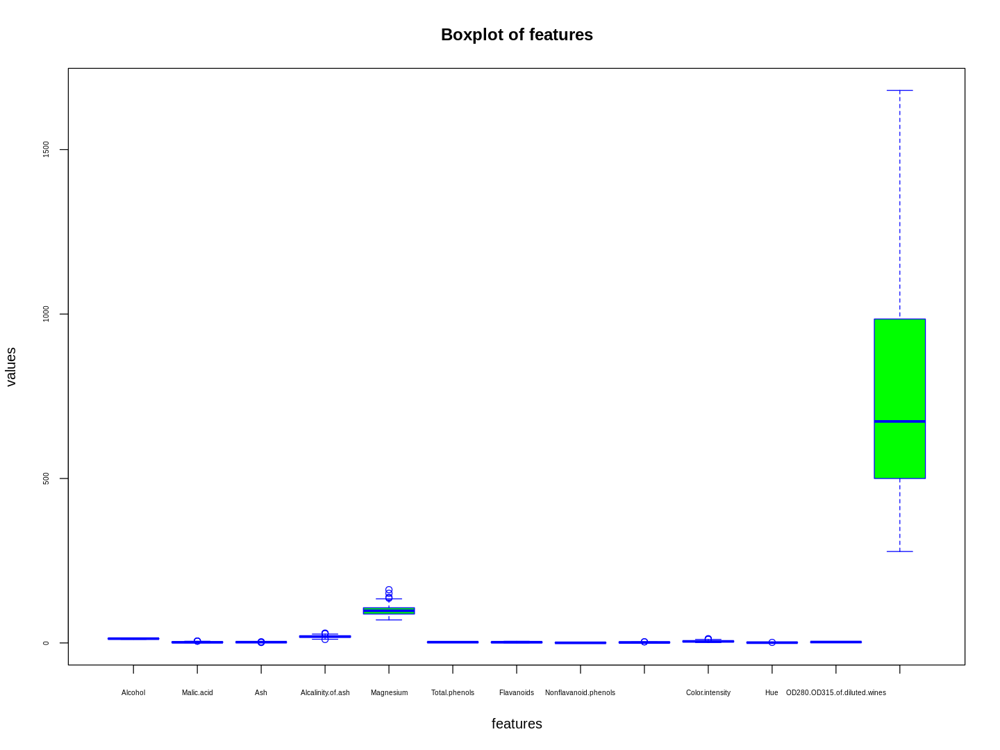

In [142]:
# boxplot of features
options(repr.plot.width=12, repr.plot.height=9)
 boxplot(data, xlab="features",ylab="values", main ="Boxplot of features", col = "green",border = "blue",cex.axis=.5)

Observation:-
- Features are not well scaled.

In [17]:
# scaling the data set
data.scaled <- scale(data)

# summary of scaled data
summary(data.scaled)

    Alcohol           Malic.acid           Ash           Alcalinity.of.ash  
 Min.   :-2.42739   Min.   :-1.4290   Min.   :-3.66881   Min.   :-2.663505  
 1st Qu.:-0.78603   1st Qu.:-0.6569   1st Qu.:-0.57051   1st Qu.:-0.687199  
 Median : 0.06083   Median :-0.4219   Median :-0.02375   Median : 0.001514  
 Mean   : 0.00000   Mean   : 0.0000   Mean   : 0.00000   Mean   : 0.000000  
 3rd Qu.: 0.83378   3rd Qu.: 0.6679   3rd Qu.: 0.69615   3rd Qu.: 0.600395  
 Max.   : 2.25341   Max.   : 3.1004   Max.   : 3.14745   Max.   : 3.145637  
   Magnesium       Total.phenols        Flavanoids      Nonflavanoid.phenols
 Min.   :-2.0824   Min.   :-2.10132   Min.   :-1.6912   Min.   :-1.8630     
 1st Qu.:-0.8221   1st Qu.:-0.88298   1st Qu.:-0.8252   1st Qu.:-0.7381     
 Median :-0.1219   Median : 0.09569   Median : 0.1059   Median :-0.1756     
 Mean   : 0.0000   Mean   : 0.00000   Mean   : 0.0000   Mean   : 0.0000     
 3rd Qu.: 0.5082   3rd Qu.: 0.80672   3rd Qu.: 0.8467   3rd Qu.: 0.6078     

In [241]:
# mean of the scaled data set
apply(data.scaled,2,mean)%>%as.data.frame()

,.
,<dbl>
Alcohol,-8.591766e-16
Malic.acid,-6.776446e-17
Ash,8.045176e-16
Alcalinity.of.ash,-7.720494e-17
Magnesium,-4.073935e-17
Total.phenols,-1.395560e-17
Flavanoids,6.958263e-17
Nonflavanoid.phenols,-1.042186e-16
Proanthocyanins,-1.221369e-16


In [242]:
# variance of the scaled dataset
apply(data.scaled,2,var)%>%as.data.frame()

,.
,<dbl>
Alcohol,1
Malic.acid,1
Ash,1
Alcalinity.of.ash,1
Magnesium,1
Total.phenols,1
Flavanoids,1
Nonflavanoid.phenols,1
Proanthocyanins,1


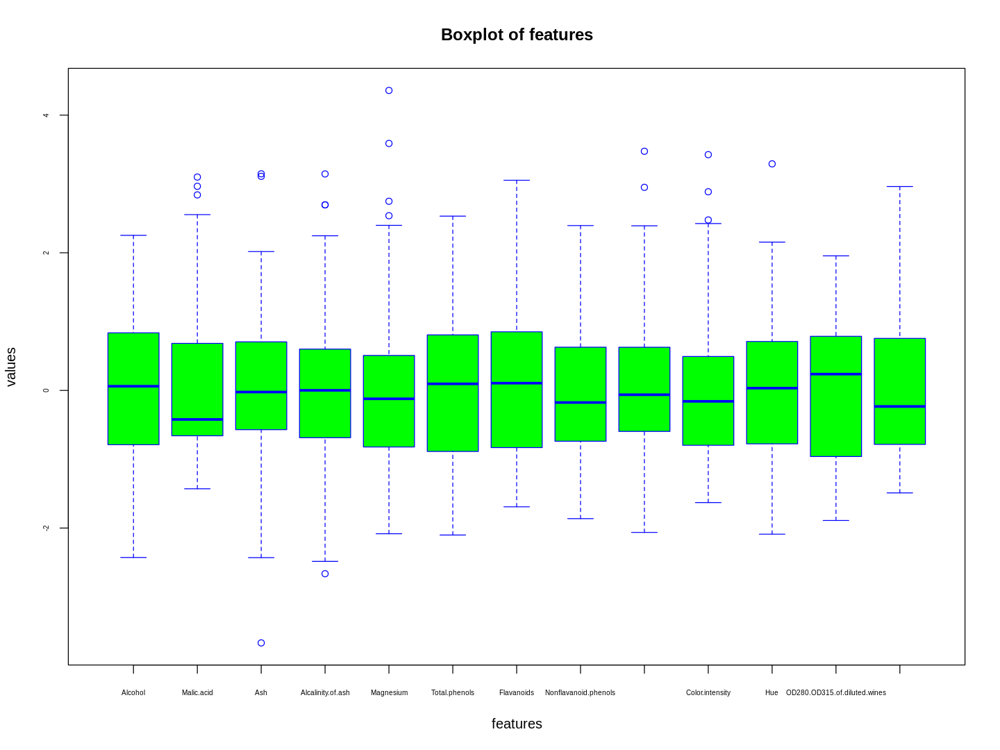

In [141]:
# boxplot of scaled features
options(repr.plot.width=12, repr.plot.height=9)
 boxplot(data.scaled, xlab="features",ylab="values", main ="Boxplot of features", col = "green",border = "blue",cex.axis=.5)

Observation:-

Now the features are well scaled and ready to be compared and to be used whenever required.

Univariate histogram and density plot to see possible number of clusters in individual clusters:-

In [72]:
# function to make the plots

library(stringr)
histf<-function(z){
  feature=str_replace_all(deparse(substitute(z)),"[data$]","")
i=0
i=i+1
#X[[1]]=feature
ggplot(data) +
aes(x = z) +
geom_histogram(aes(y=..density..), position="identity", alpha=0.5,bins = 14L, fill = "#497AD2", colour = "blue") +
geom_density(alpha=0.2, fill = "#4411D2", colour = "#4411D2")+
labs(x =  paste("Feature: ",feature),y = "No Of Obeservation",
                            title = paste("Histogrem Plot Of ",feature),
                            subtitle = paste("Distribution Of Feature ",feature),
                            caption = "wine dataset") +
                     theme_grey()
}

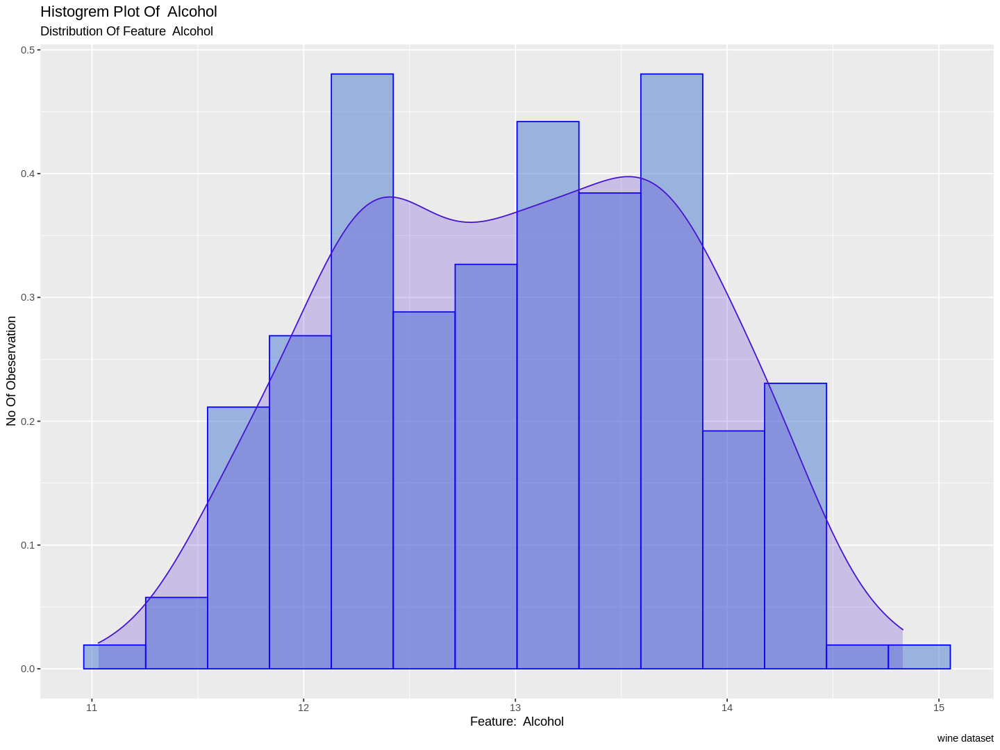

In [140]:
options(repr.plot.width=12, repr.plot.height=9)
histf(data$Alcohol)

Observation : Alcohol seems to be clustered into **2 clusters**.

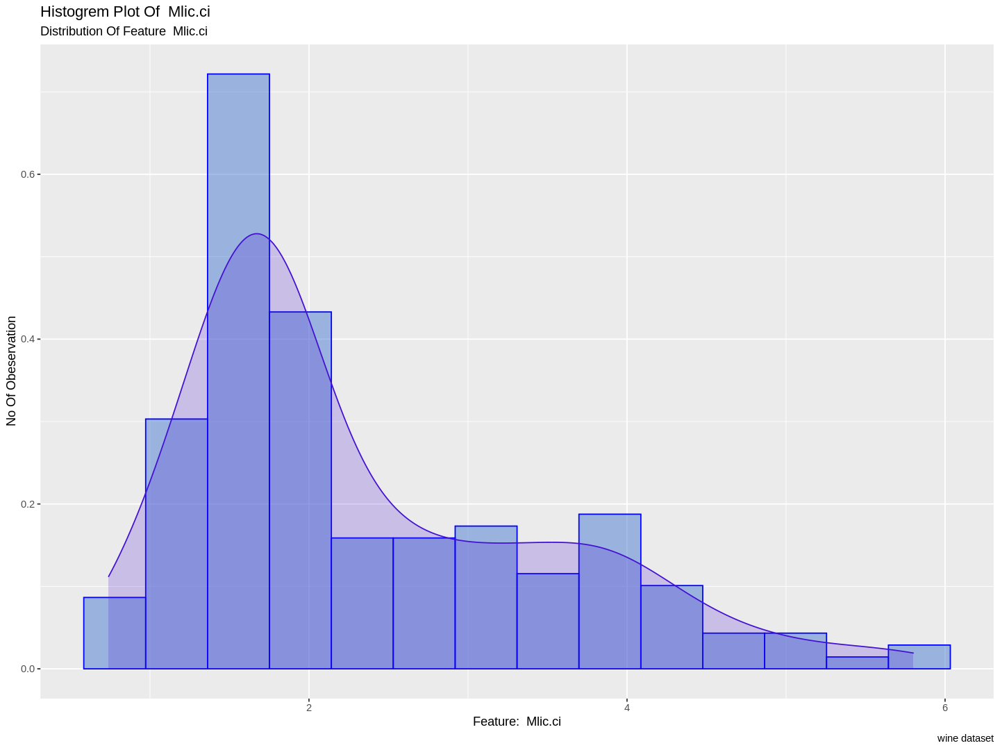

In [139]:
options(repr.plot.width=12, repr.plot.height=9)
histf(data$Malic.acid)



Observation :- Malic acid seems to be clustered into **3 distinct clusters**.

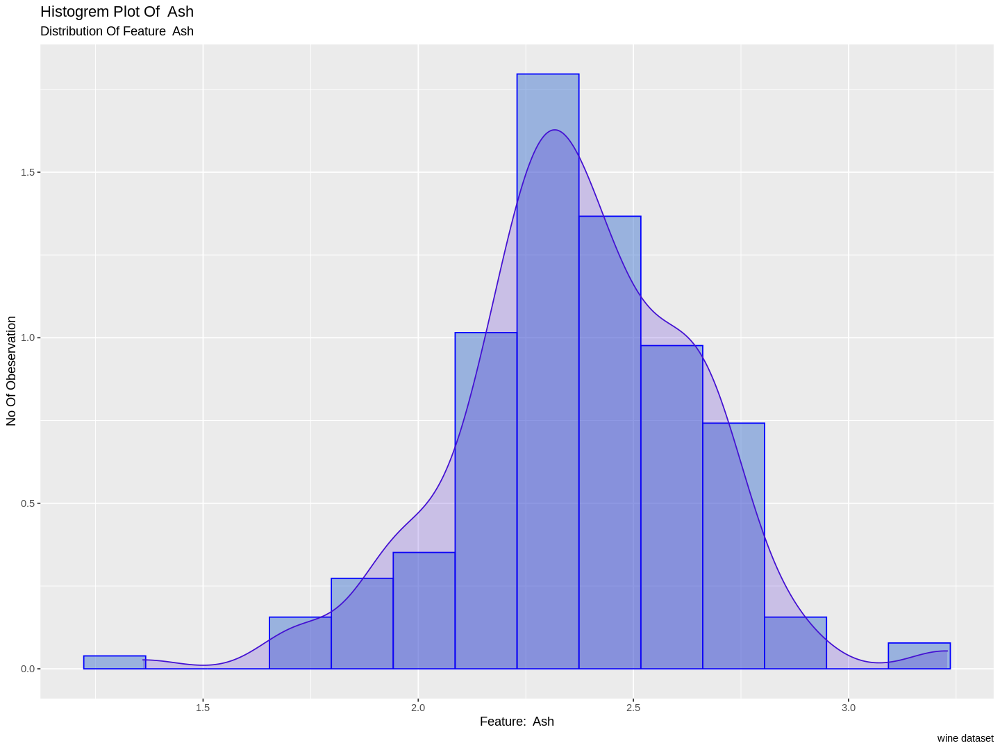

In [138]:
options(repr.plot.width=12, repr.plot.height=9)
histf(data$Ash)


Observation :- This seems to have **more than 3 clusters**. 

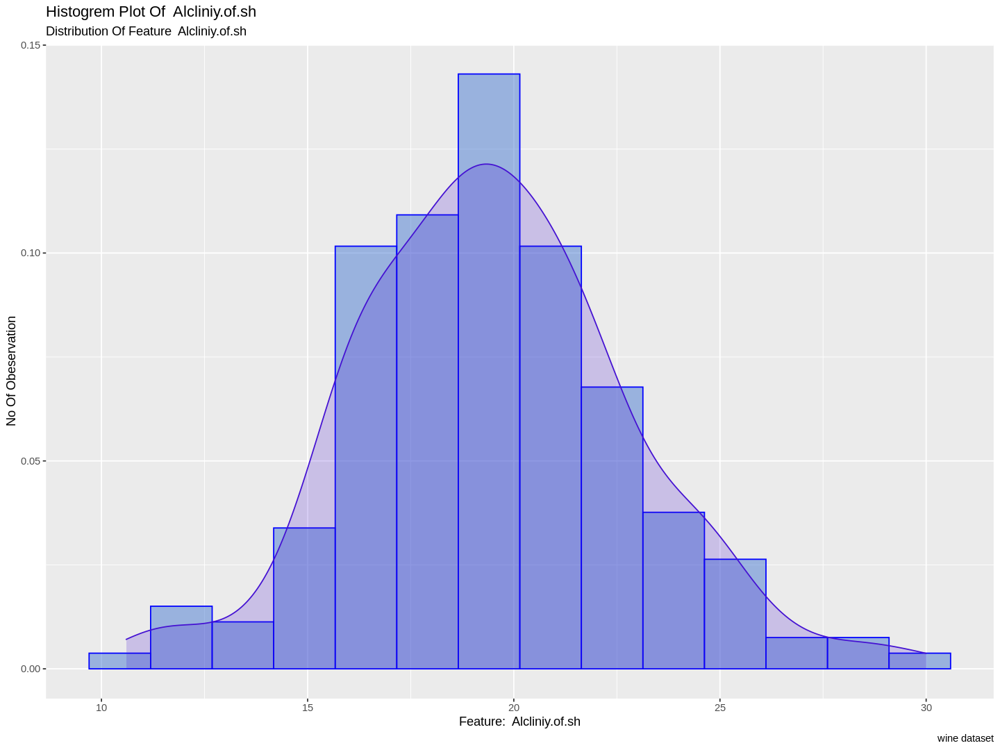

In [137]:
options(repr.plot.width=12, repr.plot.height=9)
histf(data$Alcalinity.of.ash)


Observation :- Alcalinity of ash seems to be normally distributed. Hence we can say there may be three cluster two of similar type with low and high content and one cluster having average content.

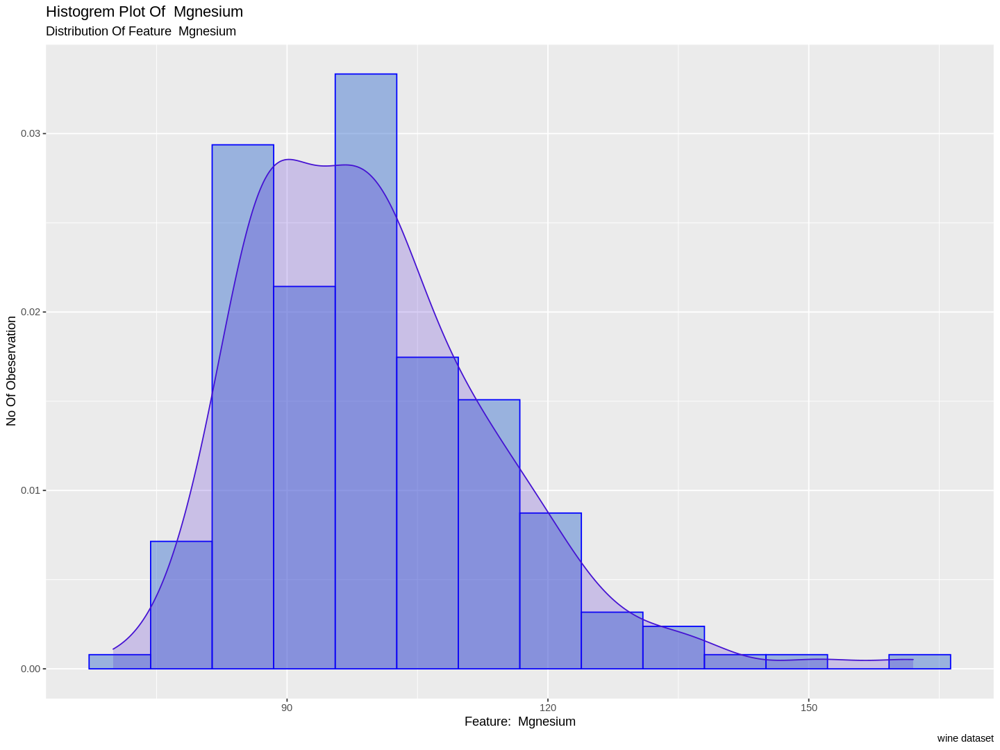

In [136]:
options(repr.plot.width=12, repr.plot.height=9)
histf(data$Magnesium)


Observation :- Magnesium seems to be clustered in **3 clusters** where two are somewhat similar which have medium magnesium and one other have high magnesium.

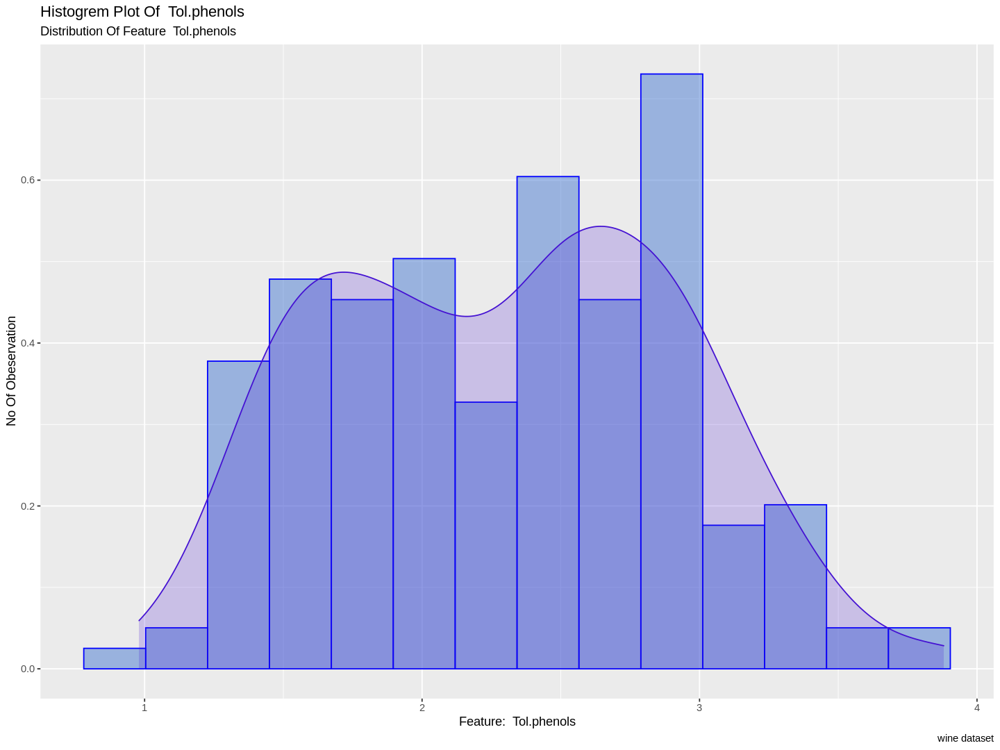

In [135]:
options(repr.plot.width=12, repr.plot.height=9)
histf(data$Total.phenols)


Observation :- Total phenol seems to be clustered in **2 clusters**.

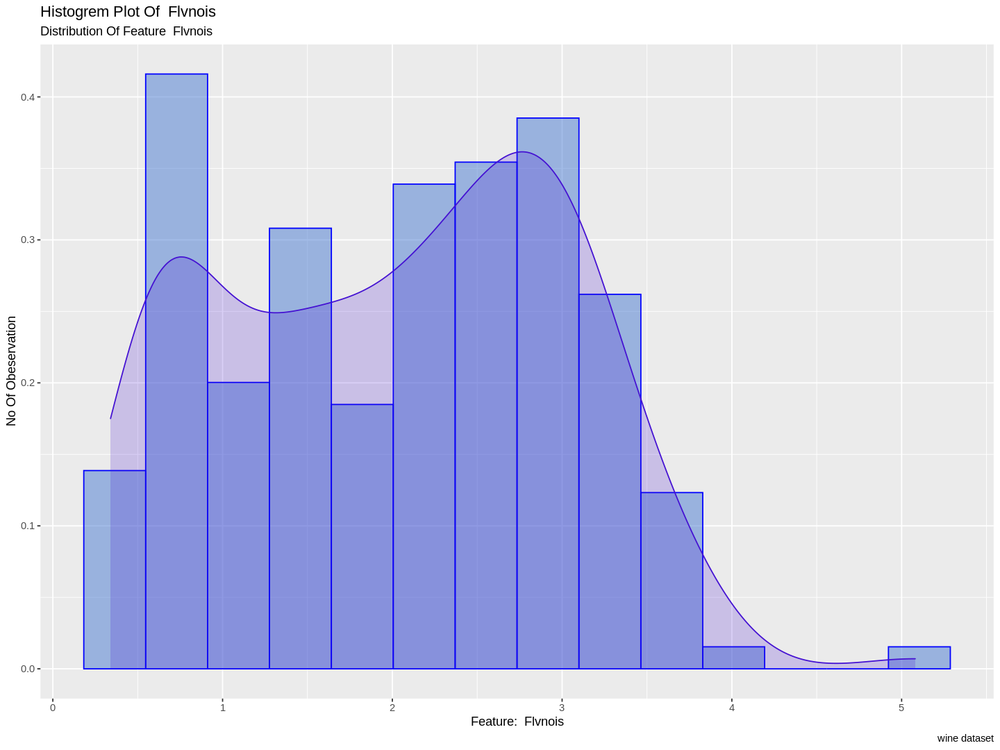

In [134]:
options(repr.plot.width=12, repr.plot.height=9)
histf(data$Flavanoids)


Observation :- Flavanoids seems to be clustered in **3 clusters**.

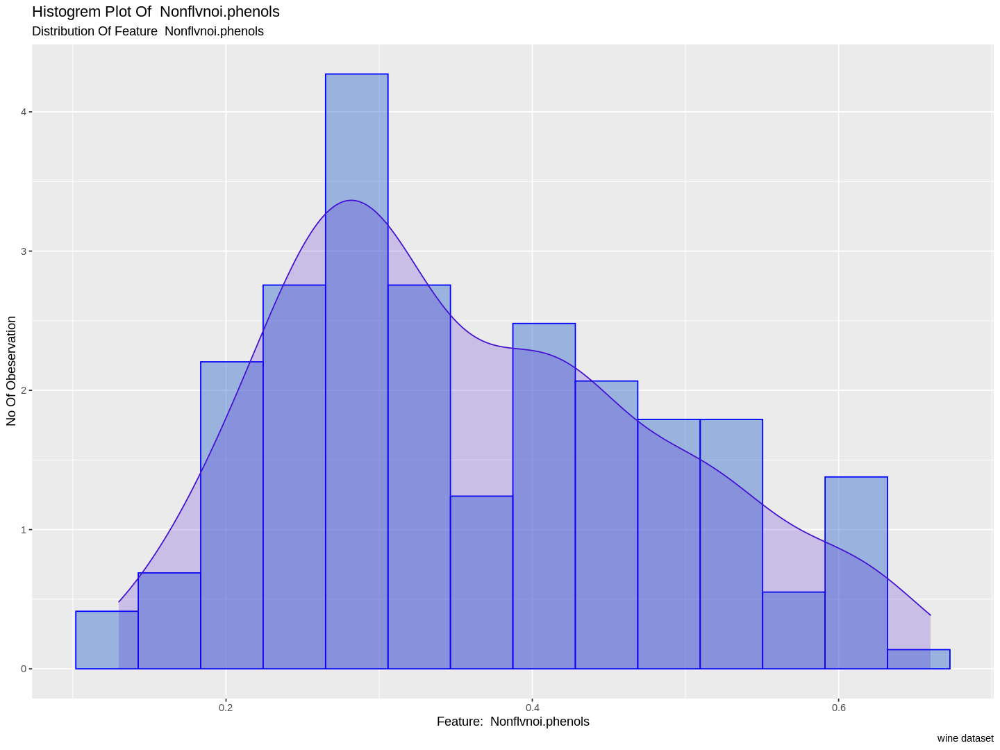

In [133]:
options(repr.plot.width=12, repr.plot.height=9)
histf(data$Nonflavanoid.phenols)

Observation :- Nonflavanoid.phenols seems to be clustered in **3 clusters**.

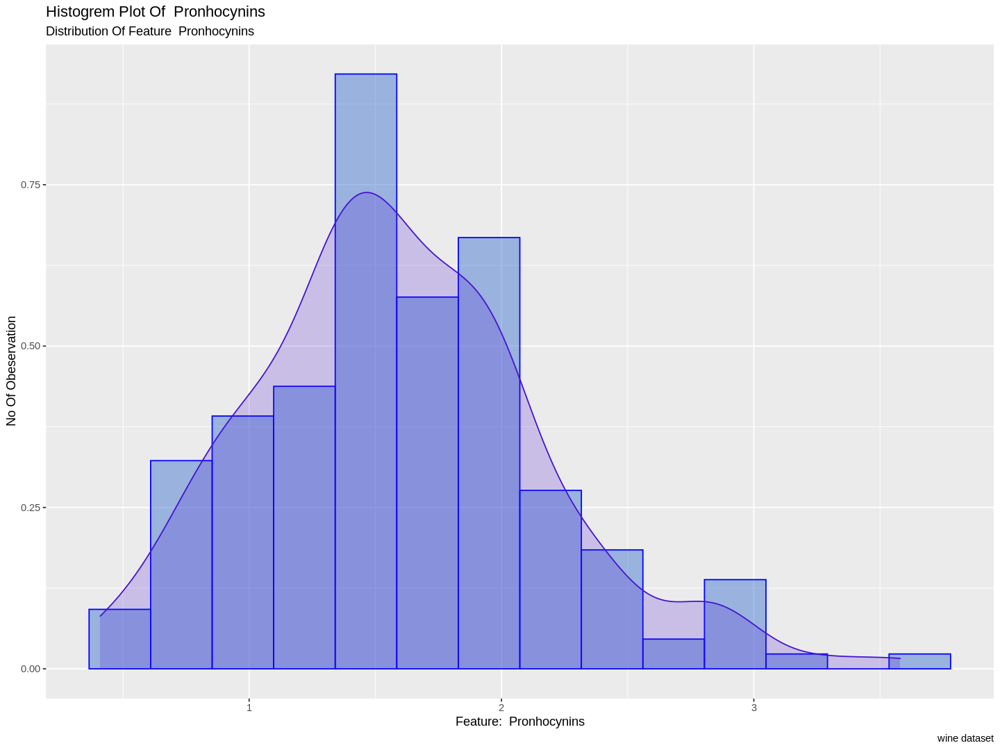

In [132]:
options(repr.plot.width=12, repr.plot.height=9)
histf(data$Proanthocyanins)


Observation :- Proanthocyanins seems to be clustered in **3 clusters**.

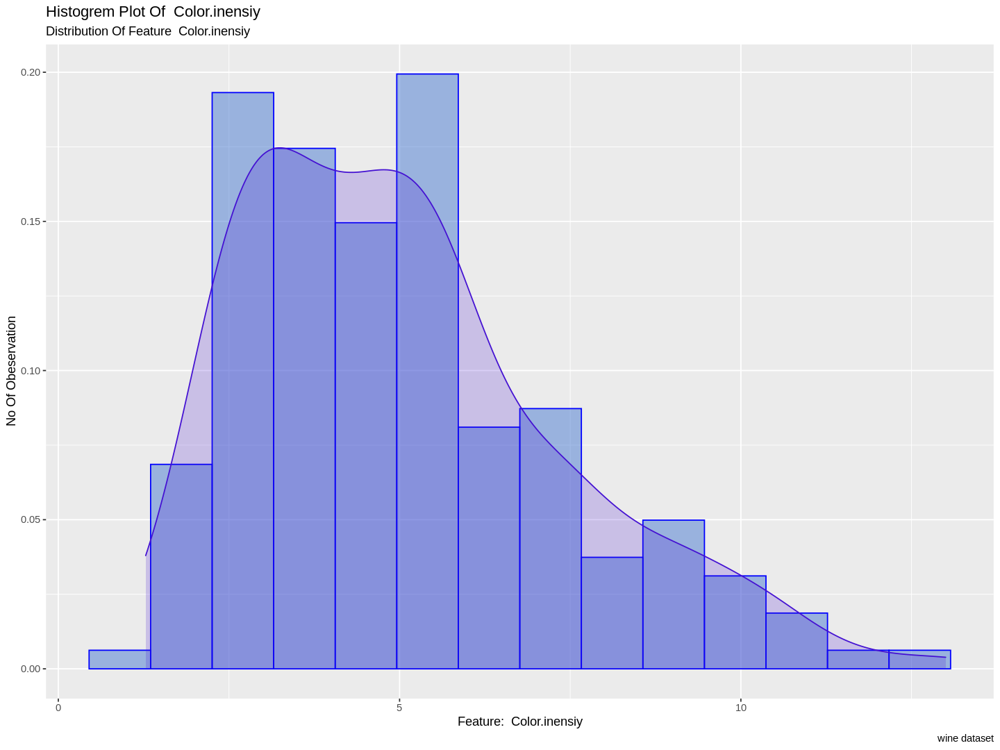

In [131]:
options(repr.plot.width=12, repr.plot.height=9)
histf(data$Color.intensity)


Observation :- Colour intensity seems to be clustered in **3 clusters**.

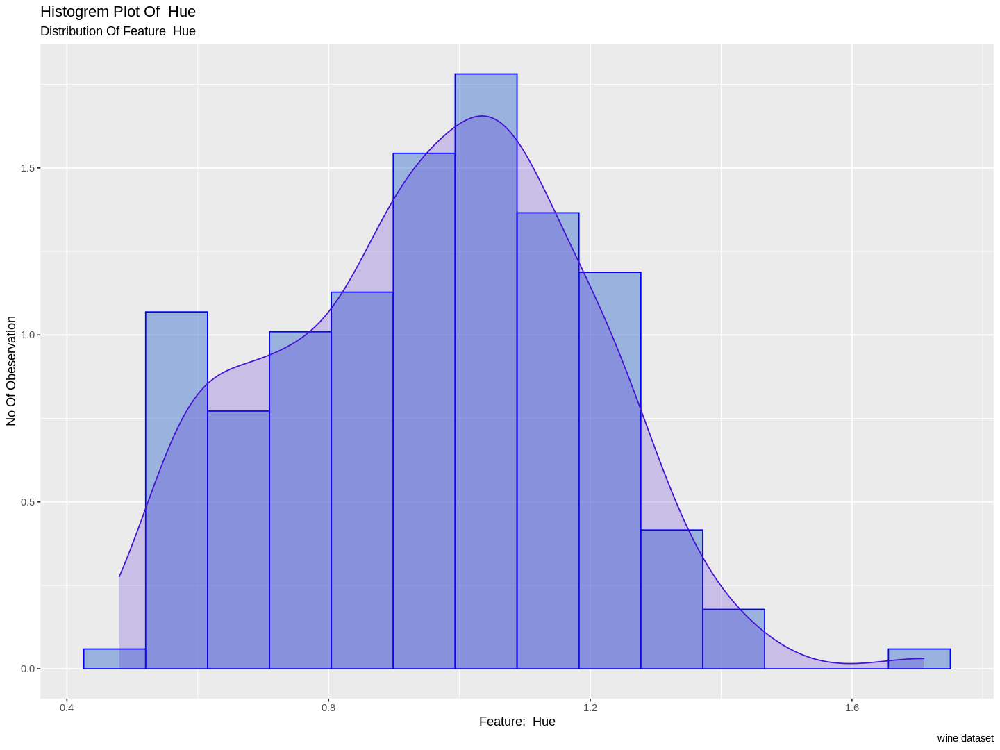

In [130]:
options(repr.plot.width=12, repr.plot.height=9)
histf(data$Hue)


Observation :- Hue seems to be clustered in **2 clusters**.

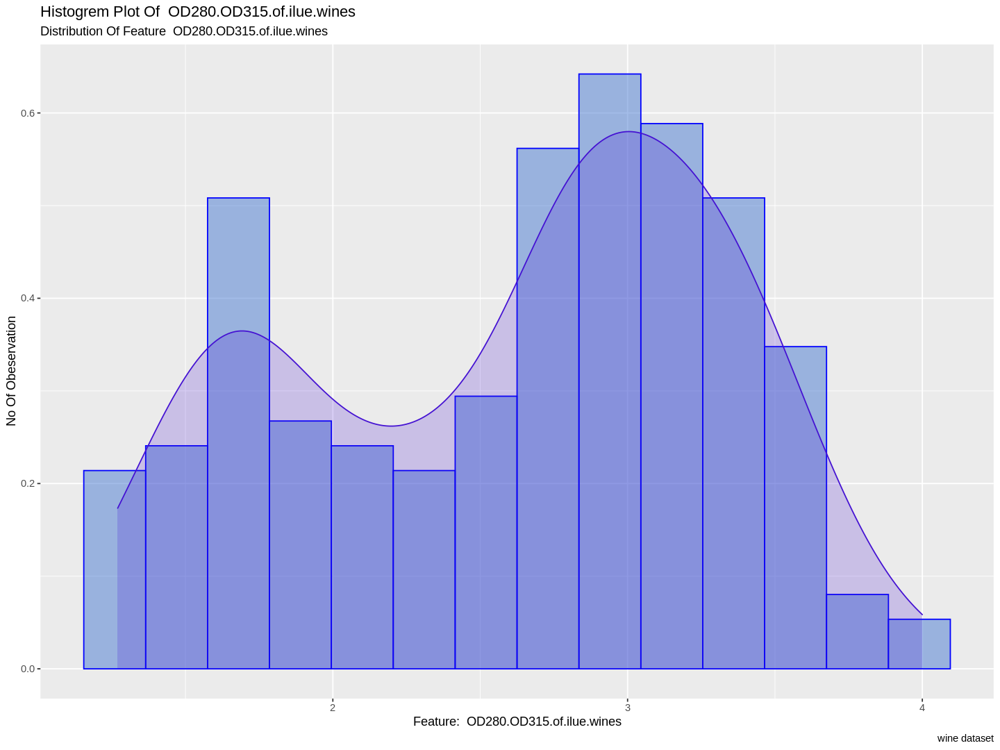

In [129]:
options(repr.plot.width=12, repr.plot.height=9)
histf(data$OD280.OD315.of.diluted.wines)

Observation:-OD280.OD315.of.diluted.wines seems to be clustered in **2 clusters**.

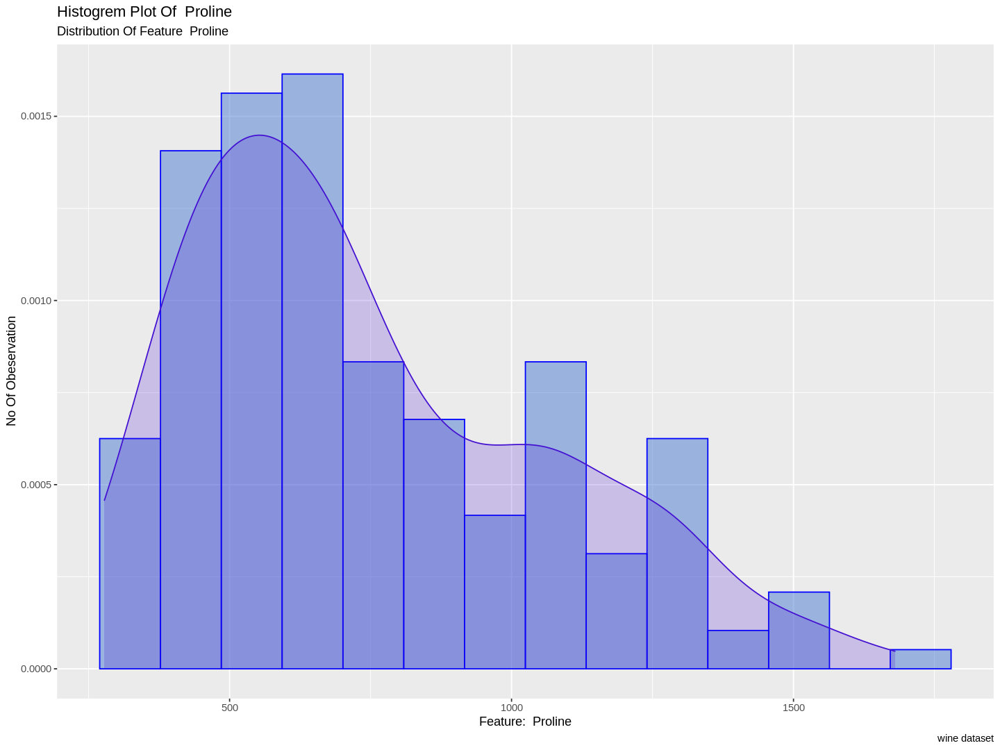

In [128]:
options(repr.plot.width=12, repr.plot.height=9)
histf(data$Proline)

Observation :- Proline seems to be clustered in **3 clusters**.

Final Conclusion From Univariate Analysis:- There seems to be 2 or 3 clusters in this wine data set. Now we will explore the multivariate analysis.

# (03). Multivariate EDA

In [332]:
suppressPackageStartupMessages(
library(dplyr)  # library for data manipulation
   )   
library(knitr)   # for using kable() function to render table

# correlation among the features
cor(data.scaled) %>% kable()



|                             |    Alcohol| Malic.acid|        Ash| Alcalinity.of.ash|  Magnesium| Total.phenols| Flavanoids| Nonflavanoid.phenols| Proanthocyanins| Color.intensity|        Hue| OD280.OD315.of.diluted.wines|    Proline|
|:----------------------------|----------:|----------:|----------:|-----------------:|----------:|-------------:|----------:|--------------------:|---------------:|---------------:|----------:|----------------------------:|----------:|
|Alcohol                      |  1.0000000|  0.0943969|  0.2115446|        -0.3102351|  0.2707982|     0.2891011|  0.2368149|           -0.1559295|       0.1366979|       0.5463642| -0.0717472|                    0.0723432|  0.6437200|
|Malic.acid                   |  0.0943969|  1.0000000|  0.1640455|         0.2885004| -0.0545751|    -0.3351670| -0.4110066|            0.2929771|      -0.2207462|       0.2489853| -0.5612957|                   -0.3687104| -0.1920106|
|Ash                          |  0.2115446|  0.1640455

Scatter plot of all the features:-

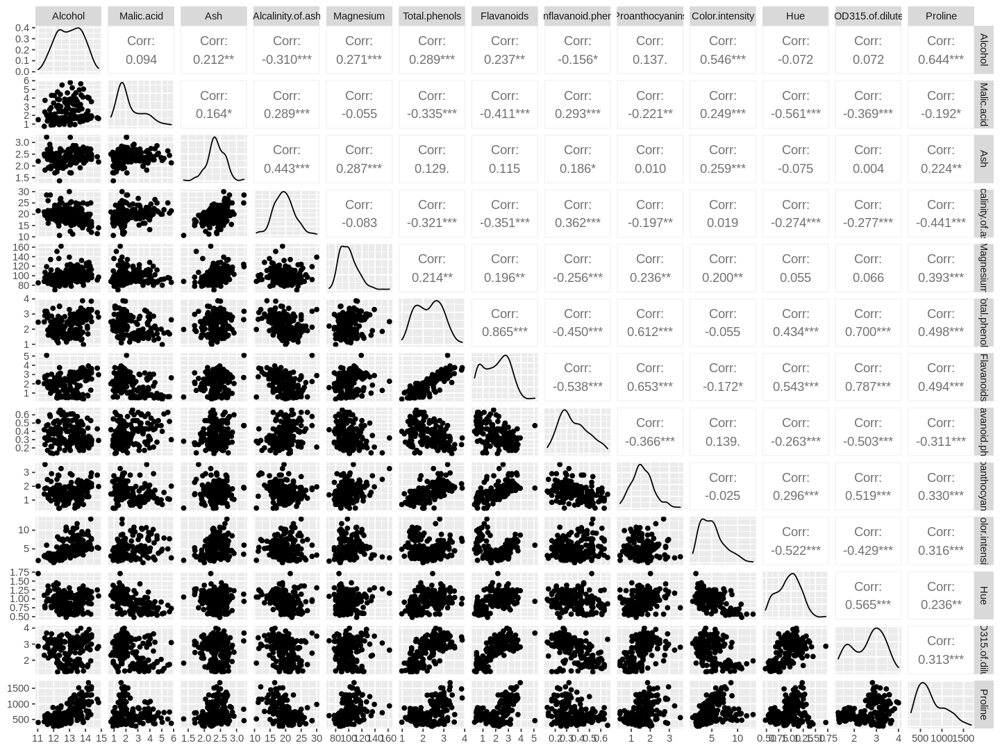

In [330]:
#install.packages("GGally")
options(repr.plot.width=12, repr.plot.height=9)
library(GGally)
ggpairs(data)

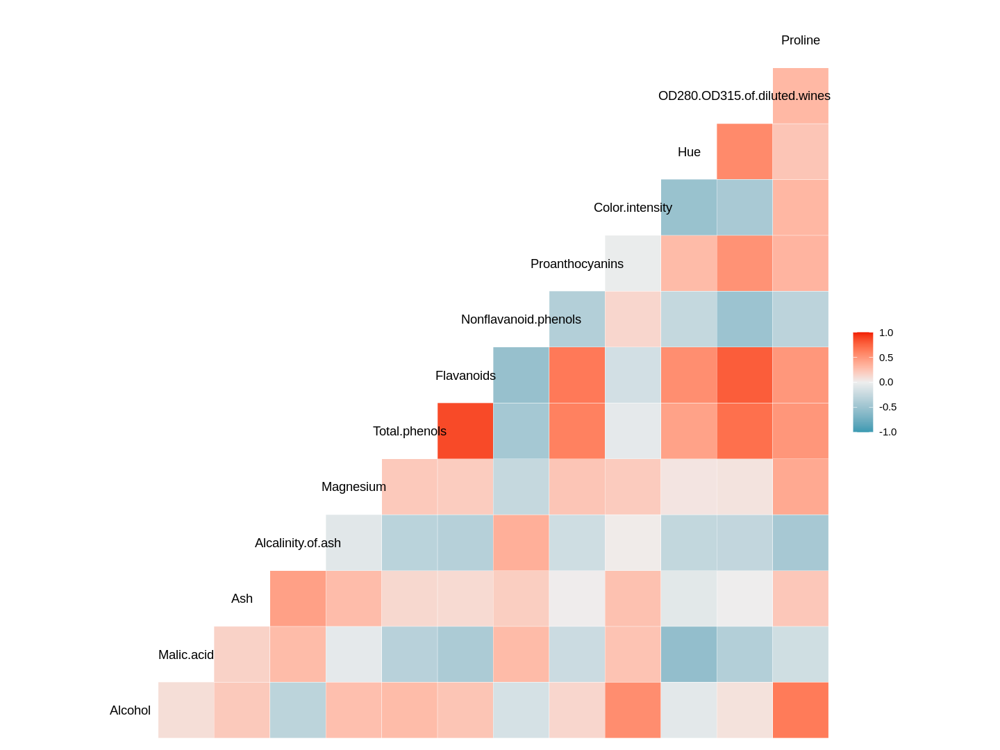

In [328]:
# correlation plot
options(repr.plot.width=12, repr.plot.height=9)
ggcorr(data)

Observation:-
- Alcohol and proline seems to be positively correlated
- Alcohol and colour intensity seems to be positively correlated
- Malic acid and Hue seems to be negatively correlated
- There are many more correalted features which gives overall idea of how the features are corellated with each other

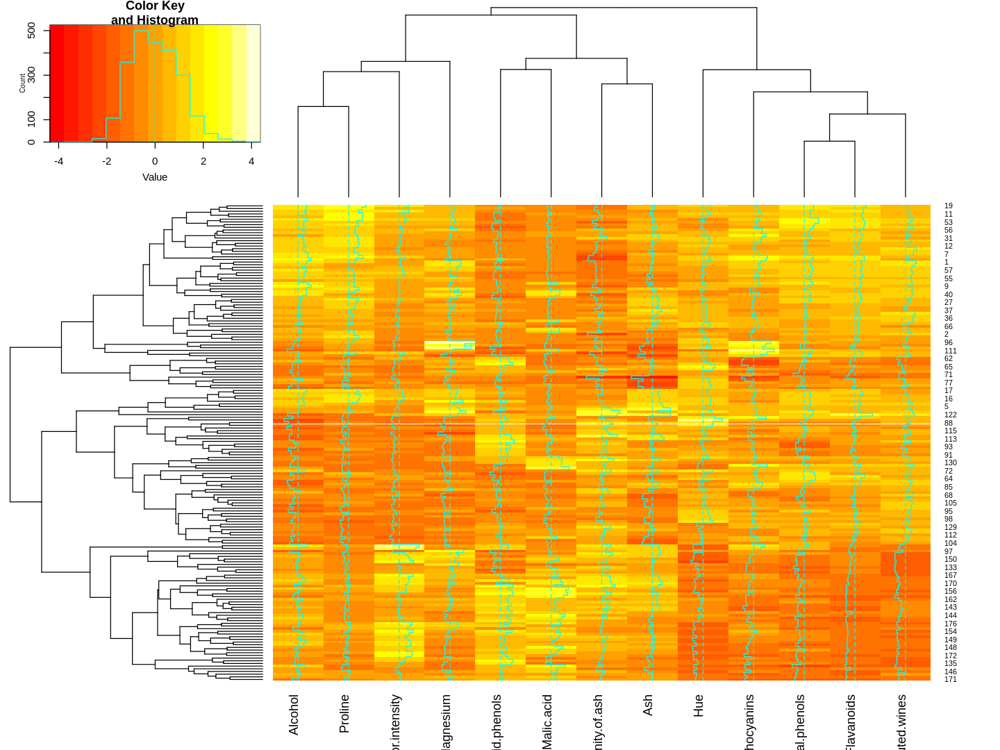

In [329]:
# heatmap
options(repr.plot.width=12, repr.plot.height=9)
#install.packages("gplots")
library("gplots")
heatmap.2(as.matrix(data.scaled),scale = "none")

In [327]:
# Disimilarity matrix

dist.eucl <-dist(data.scaled, method = "euclidean")
round(as.matrix(dist(data.scaled, method = "euclidean"))[1:20,1:20],1)

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20
1,0.0,3.5,3.0,2.8,3.6,2.5,2.5,2.4,3.0,2.5,2.8,3.4,3.4,3.9,3.4,3.1,2.7,3.0,3.5,2.5
2,3.5,0.0,4.1,4.3,4.6,3.4,2.7,3.3,2.7,2.5,3.7,2.7,2.6,4.2,4.3,3.5,4.4,4.1,4.3,2.9
3,3.0,4.1,0.0,3.2,3.0,2.9,2.8,3.5,3.6,2.9,2.5,3.4,2.7,3.6,3.3,3.0,2.7,2.8,3.5,3.1
4,2.8,4.3,3.2,0.0,4.5,1.9,3.2,3.3,3.5,2.7,2.7,4.0,3.5,4.1,2.9,3.2,2.9,3.2,2.4,3.5
5,3.6,4.6,3.0,4.5,0.0,3.9,4.0,3.0,4.4,4.0,4.2,4.0,3.9,5.1,5.4,3.1,2.6,2.4,4.7,3.0
6,2.5,3.4,2.9,1.9,3.9,0.0,2.3,2.6,2.4,2.4,2.1,2.8,2.3,3.0,2.3,2.1,2.1,2.2,1.6,3.2
7,2.5,2.7,2.8,3.2,4.0,2.3,0.0,2.5,1.9,2.0,2.4,1.8,1.6,3.1,3.1,2.8,3.0,3.2,3.3,2.9
8,2.4,3.3,3.5,3.3,3.0,2.6,2.5,0.0,3.4,3.0,3.1,2.7,2.9,4.7,4.4,2.0,2.2,2.5,3.4,2.5
9,3.0,2.7,3.6,3.5,4.4,2.4,1.9,3.4,0.0,2.1,2.6,2.1,2.1,2.5,3.0,3.3,3.4,3.3,3.4,3.2
10,2.5,2.5,2.9,2.7,4.0,2.4,2.0,3.0,2.1,0.0,2.5,2.4,2.0,3.6,3.3,2.8,3.2,3.0,3.0,2.7


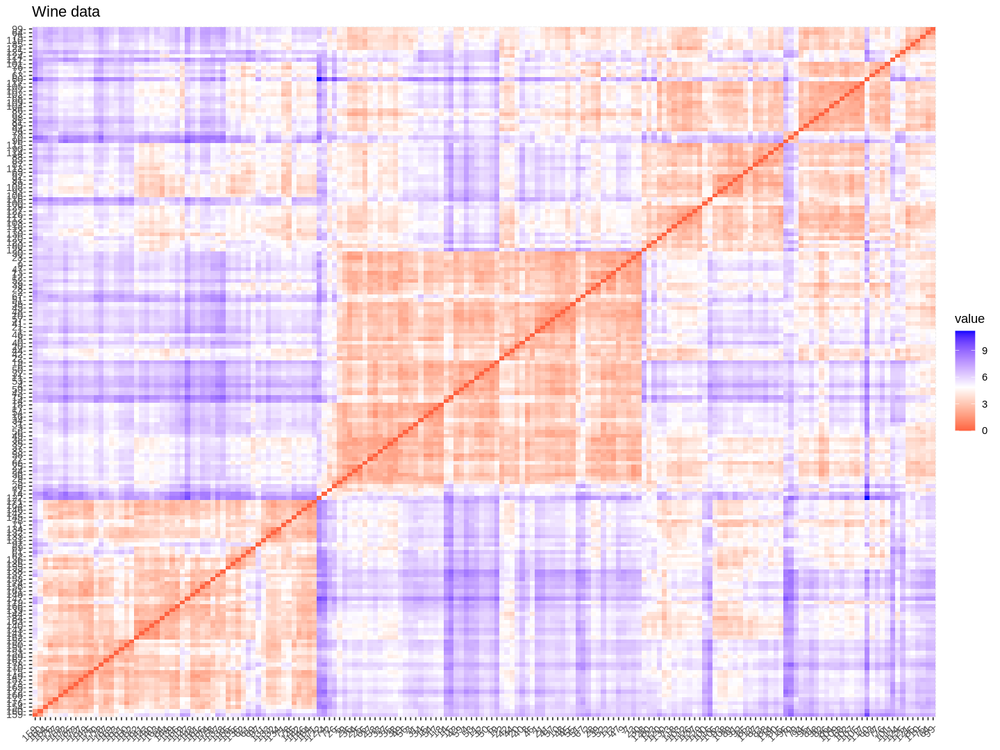

In [124]:
# Visualising disimiarity matrix
options(repr.plot.width=12, repr.plot.height=9)
#install.packages("factoextra")
library(factoextra)   # useful library for visualising cluster analysis
fviz_dist(dist.eucl)+labs(title="Wine data")

Observation:-
- The above two plots, heat map and disimilarity matrix plot gives an over all idea of how and how much cluster could be there in our data set. 
- Its too early to say but there seems to be three potential cluster (can be concluded by looking at the clustering pattern in heatmap and number of rectangular boxes in dissimilarity matrix plot) in our data set.

# (04). Principle Component Analysis and Feature Exploration

Now I will do principal component analysis to sort out the minimum number of features which could 
explain the maximum variability of the data set and also to see clustering tendency by plotting the principle component.

In [325]:
#principle component
options(repr.plot.width=12, repr.plot.height=9)
pca.out<-prcomp(data.scaled)
summary(pca.out)

Importance of components:
                         PC1    PC2    PC3     PC4     PC5     PC6     PC7
Standard deviation     2.169 1.5802 1.2025 0.95863 0.92370 0.80103 0.74231
Proportion of Variance 0.362 0.1921 0.1112 0.07069 0.06563 0.04936 0.04239
Cumulative Proportion  0.362 0.5541 0.6653 0.73599 0.80162 0.85098 0.89337
                           PC8     PC9   PC10    PC11    PC12    PC13
Standard deviation     0.59034 0.53748 0.5009 0.47517 0.41082 0.32152
Proportion of Variance 0.02681 0.02222 0.0193 0.01737 0.01298 0.00795
Cumulative Proportion  0.92018 0.94240 0.9617 0.97907 0.99205 1.00000

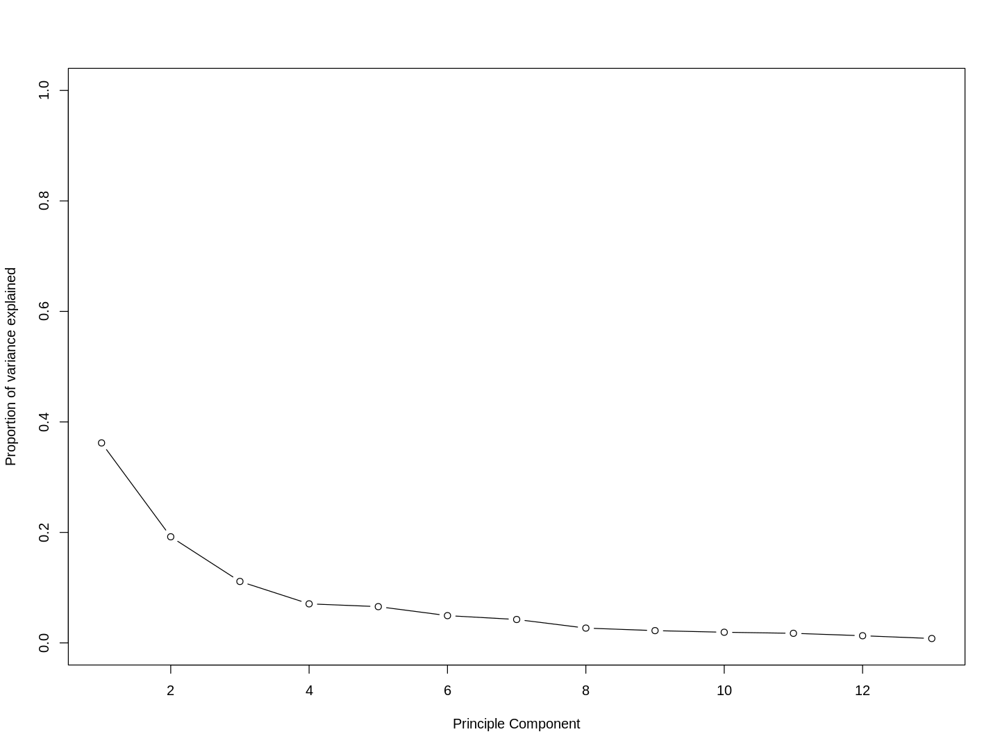

In [122]:
#PVE proportion of variance explained by each principle components
pr.var <- pca.out$sdev^2
pve <- pr.var/sum(pr.var)
options(repr.plot.width=12, repr.plot.height=9)
# plot of PVE explained by each principle component
plot(pve, xlab="Principle Component", ylab = "Proportion of variance explained", ylim=c(0,1), type="b")

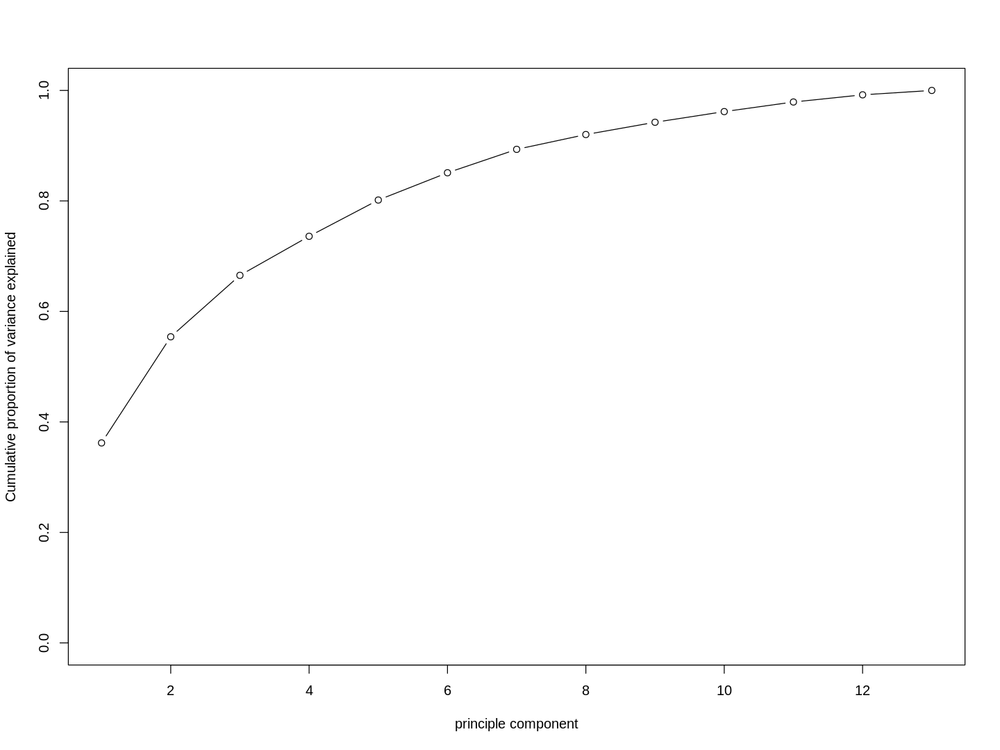

In [121]:
# Cumulative proportion of variance explained
options(repr.plot.width=12, repr.plot.height=9)
plot(cumsum(pve), xlab="principle component",ylab="Cumulative proportion of variance explained", ylim=c(0,1), type="b")

Observation:-
We can observe the cumulative proportion of variability explained by each principle components. PC1 to PC9 explains the 0.9424 proportion of variability of the data.

Now I will see the clustering tendency by visualising the principle components.

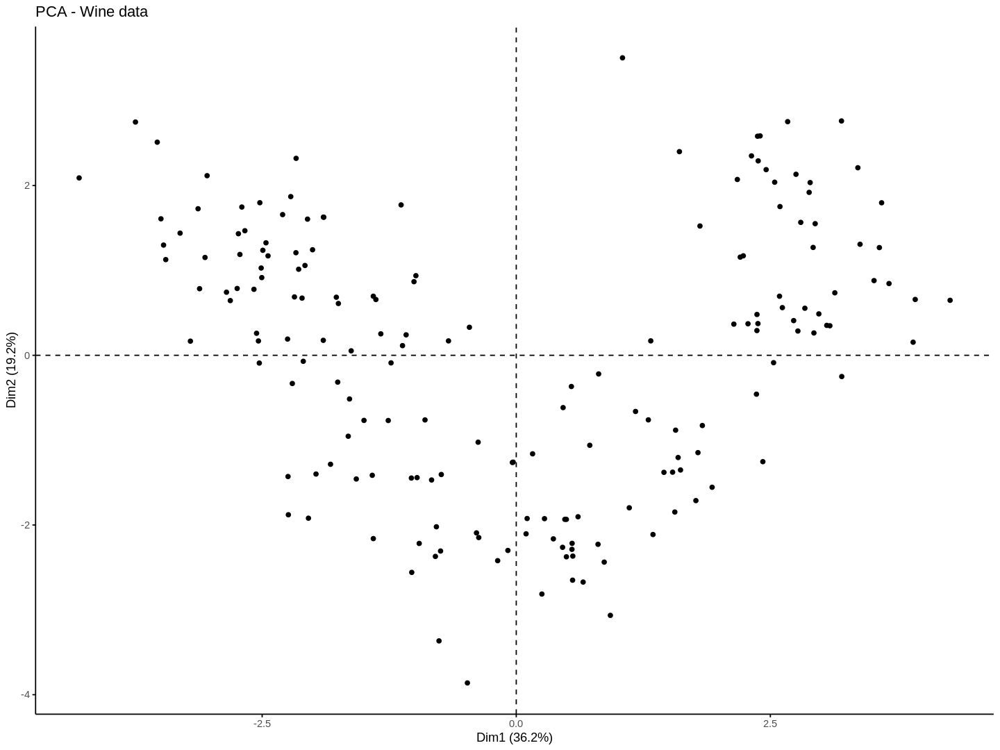

In [120]:
# Plot the principle compotent
options(repr.plot.width=12, repr.plot.height=9)
fviz_pca_ind(pca.out, title = "PCA - Wine data",
geom = "point", ggtheme = theme_classic())

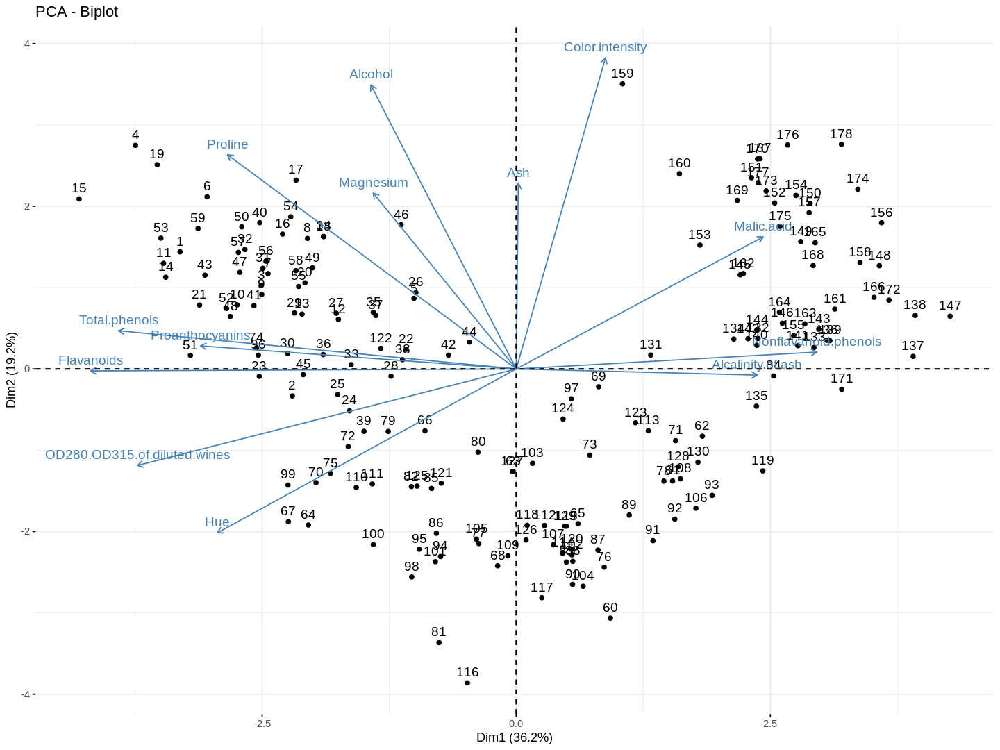

In [119]:
# biplot
options(repr.plot.width=12, repr.plot.height=9)
fviz_pca_biplot(pca.out)

Observation:-
1. Alcohol, Color intensity, Proline, Magnesium, Ash seems to influence the formation a cluster.
2. Hue, Total phenols, Flavanoids, 0D280/0D315 of diluted wines seems to influence the formation of yet another cluster.
3. Malic acid, Nonflavanoid phenols, Alcalinity of ash seems to influence the  formation of yet yet another cluster.


# (05). Kmeans clustering

Now I will do kmeans clustering on wine dataset. The steps involve:-
1. Finding the optimum numbers of cluster for kmeans
2. Next, will do the kmeans clustering 
3. Next, will visualise the cluster
4. Next, will present the summary

Optimum number of cluster (Elbow method):-

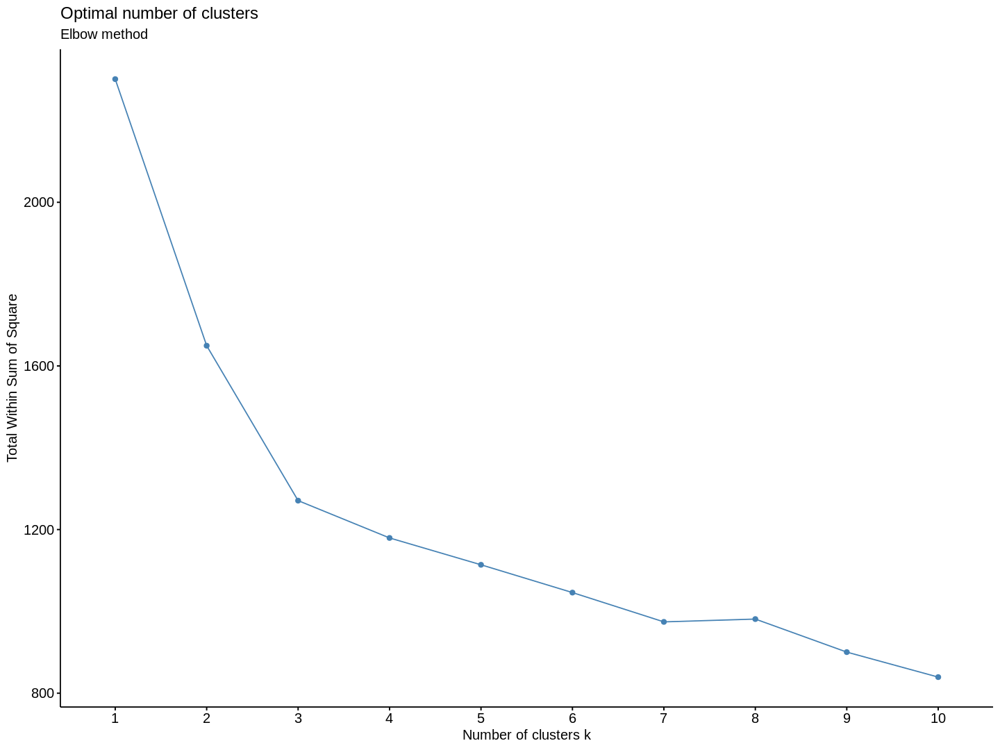

In [257]:
# k-means clustering
# deciding optimul number of cluster
# Elbow method
options(repr.plot.width=12, repr.plot.height=9)
fviz_nbclust(data.scaled, kmeans, method="wss")+labs(subtitle = "Elbow method")

Observation :-
We can see elbow at k = 3.

Modified plot:-

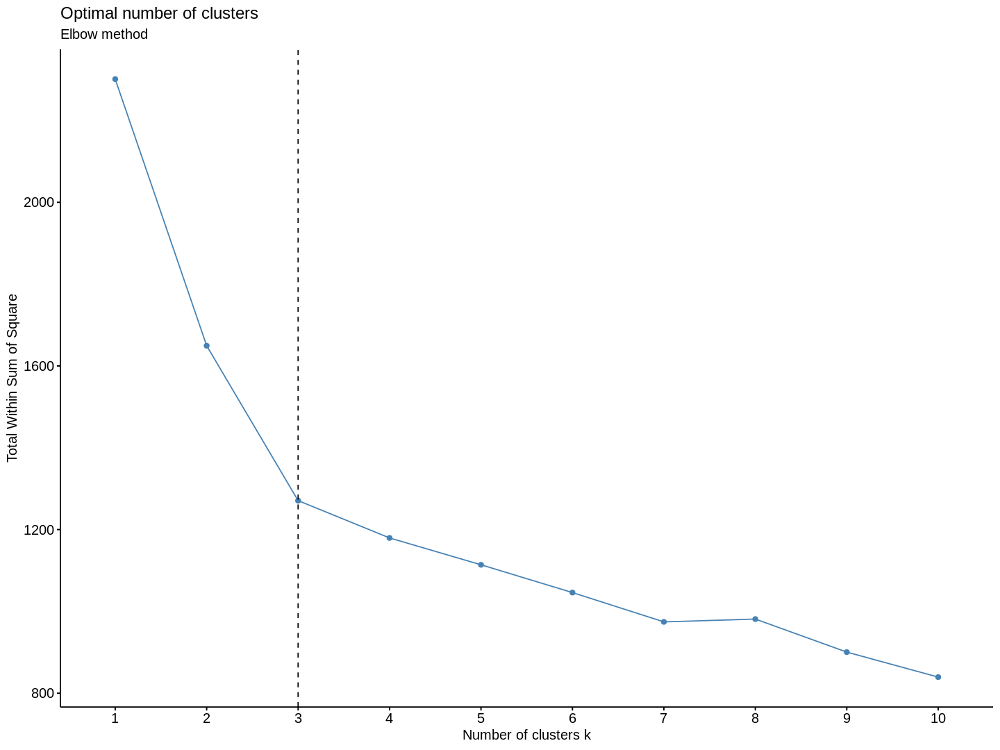

In [258]:
options(repr.plot.width=12, repr.plot.height=9)
fviz_nbclust(data.scaled, kmeans, method = "wss")+
  geom_vline(xintercept = 3, linetype = 2)+labs(subtitle = "Elbow method")

Optimum number of cluster (Silhouette method)

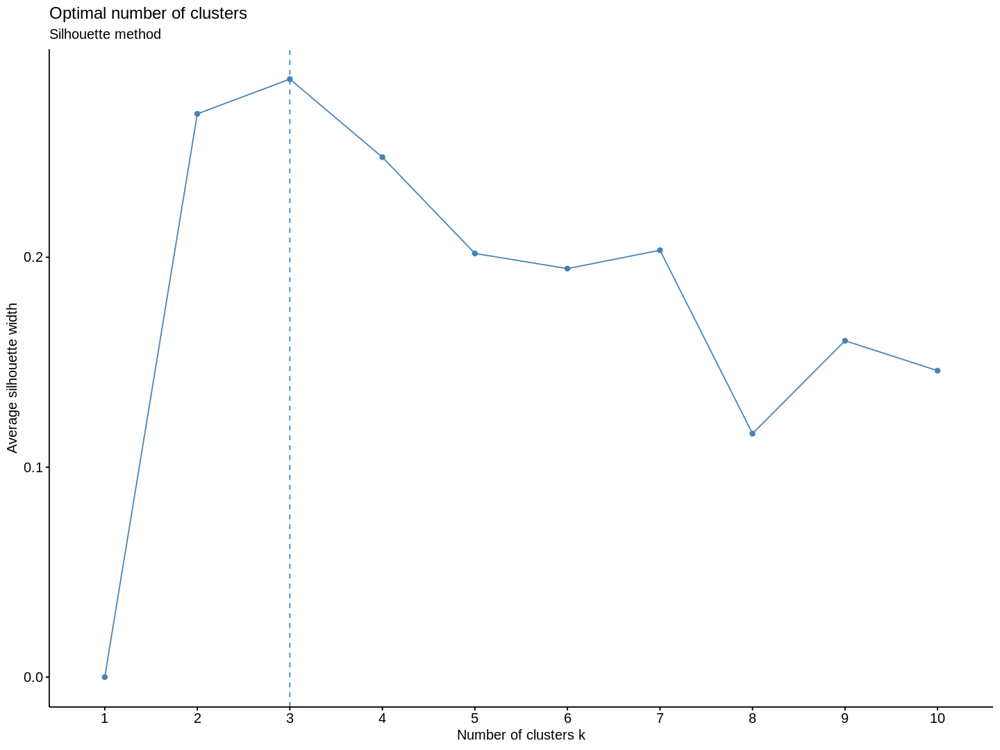

In [259]:
# Silhouette method
options(repr.plot.width=12, repr.plot.height=9)
fviz_nbclust(data.scaled, kmeans, method = "silhouette")+
labs(subtitle = "Silhouette method")

Optimum number of cluster (Gap statistics)

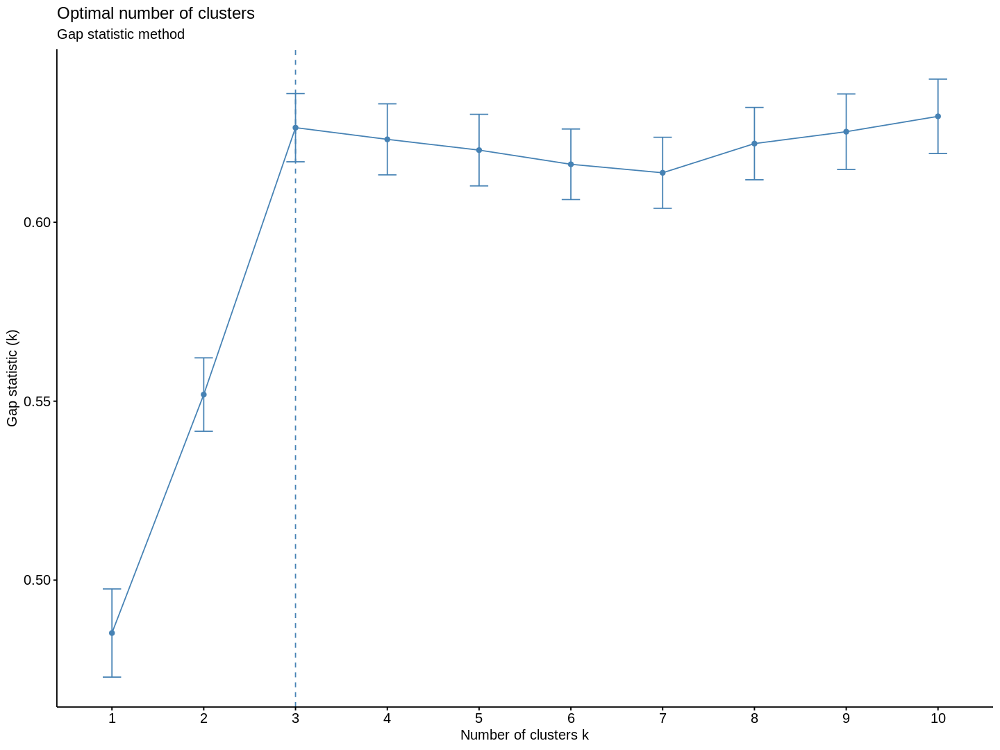

In [260]:
# Gap statistic
# nboot = 50 to keep the function speedy.
# recommended value: nboot= 500 for your analysis.
# Use verbose = FALSE to hide computing progression.
set.seed(123)
options(repr.plot.width=12, repr.plot.height=9)
fviz_nbclust(data.scaled, kmeans, nstart = 25, method = "gap_stat", nboot = 50)+
labs(subtitle = "Gap statistic method")

Optimum number of cluster (NbClust() method, Majority rule)

*** : The Hubert index is a graphical method of determining the number of clusters.
                In the plot of Hubert index, we seek a significant knee that corresponds to a 
                significant increase of the value of the measure i.e the significant peak in Hubert
                index second differences plot. 
 


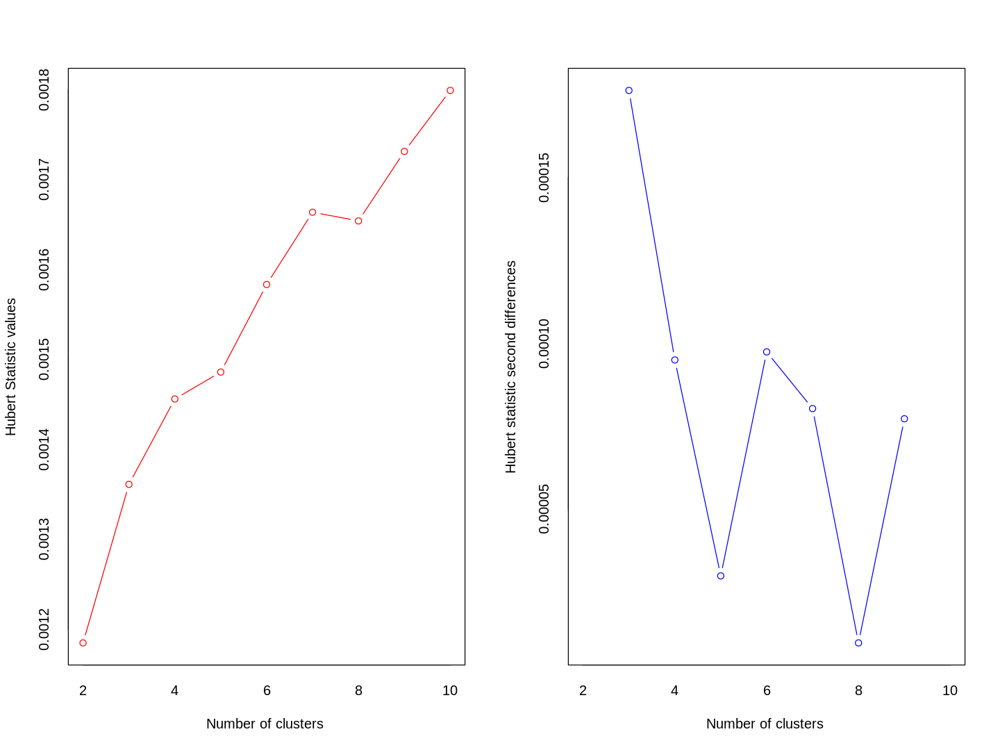

*** : The D index is a graphical method of determining the number of clusters. 
                In the plot of D index, we seek a significant knee (the significant peak in Dindex
                second differences plot) that corresponds to a significant increase of the value of
                the measure. 
 
******************************************************************* 
* Among all indices:                                                
* 2 proposed 2 as the best number of clusters 
* 19 proposed 3 as the best number of clusters 
* 2 proposed 10 as the best number of clusters 

                   ***** Conclusion *****                            
 
* According to the majority rule, the best number of clusters is  3 
 
 
******************************************************************* 
Among all indices: 
* 2 proposed  0 as the best number of clusters
* 1 proposed  1 as the best number of clusters
* 2 proposed  2 as the best number of clusters
* 19 proposed  3 as the best num

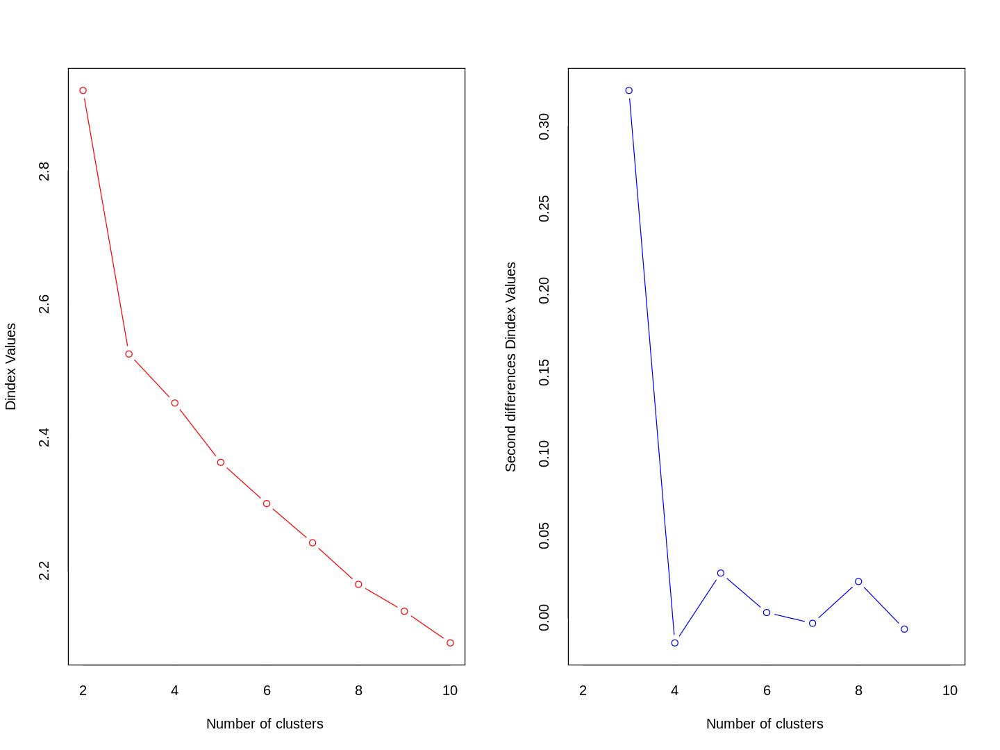

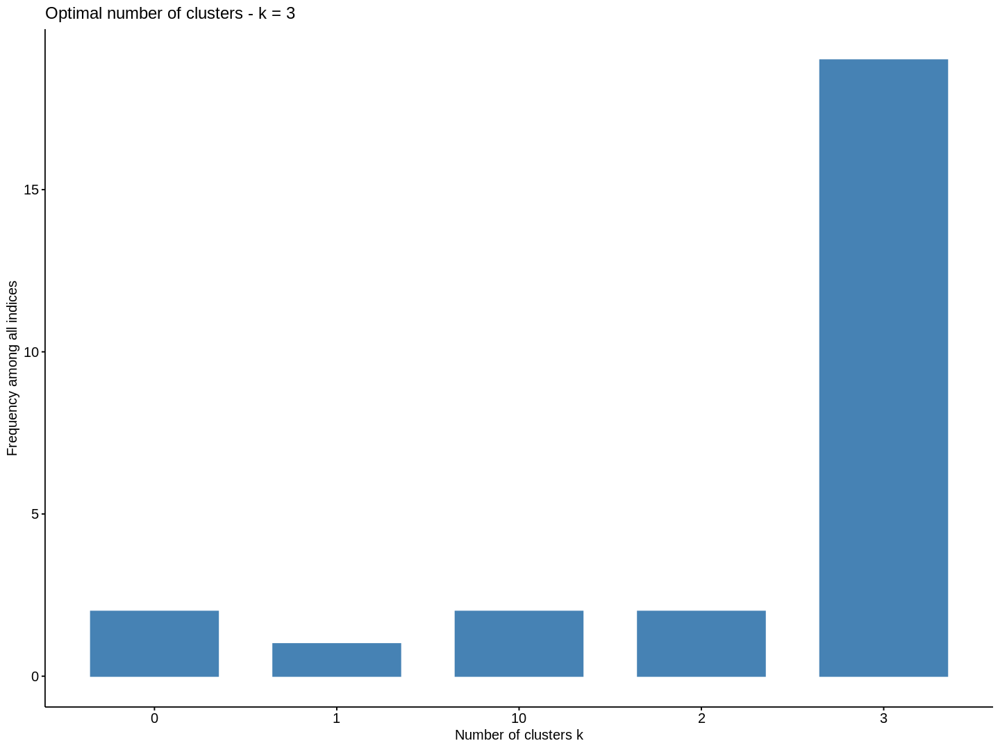

In [322]:
#install.packages("NbClust")
library(NbClust)
nb <- NbClust(data.scaled, distance = "euclidean", min.nc = 2,
max.nc = 10, method = "kmeans")
options(repr.plot.width=12, repr.plot.height=9)
suppressWarnings(
# visualising the result
fviz_nbclust(nb)
)

Observation:-
We seen different method to decide the optimum number of cluster for kmeans and the maximum algorithm gave k=3 as optimum number of cluster for k-means clustering. 

Now I will do the k-means clustering:-

In [262]:
# Compute k-means with k = 3
set.seed(123)
km.res <- kmeans(data.scaled, 3, nstart = 25)
print(km.res)

K-means clustering with 3 clusters of sizes 51, 62, 65

Cluster means:
     Alcohol Malic.acid        Ash Alcalinity.of.ash   Magnesium Total.phenols
1  0.1644436  0.8690954  0.1863726         0.5228924 -0.07526047   -0.97657548
2  0.8328826 -0.3029551  0.3636801        -0.6084749  0.57596208    0.88274724
3 -0.9234669 -0.3929331 -0.4931257         0.1701220 -0.49032869   -0.07576891
   Flavanoids Nonflavanoid.phenols Proanthocyanins Color.intensity        Hue
1 -1.21182921           0.72402116     -0.77751312       0.9388902 -1.1615122
2  0.97506900          -0.56050853      0.57865427       0.1705823  0.4726504
3  0.02075402          -0.03343924      0.05810161      -0.8993770  0.4605046
  OD280.OD315.of.diluted.wines    Proline
1                   -1.2887761 -0.4059428
2                    0.7770551  1.1220202
3                    0.2700025 -0.7517257

Clustering vector:
  [1] 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 [38] 2 2 2 2 2 2 2 2 2 2 2 2 2 2

Visualising k-means:-

Warning message:
“ggrepel: 36 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


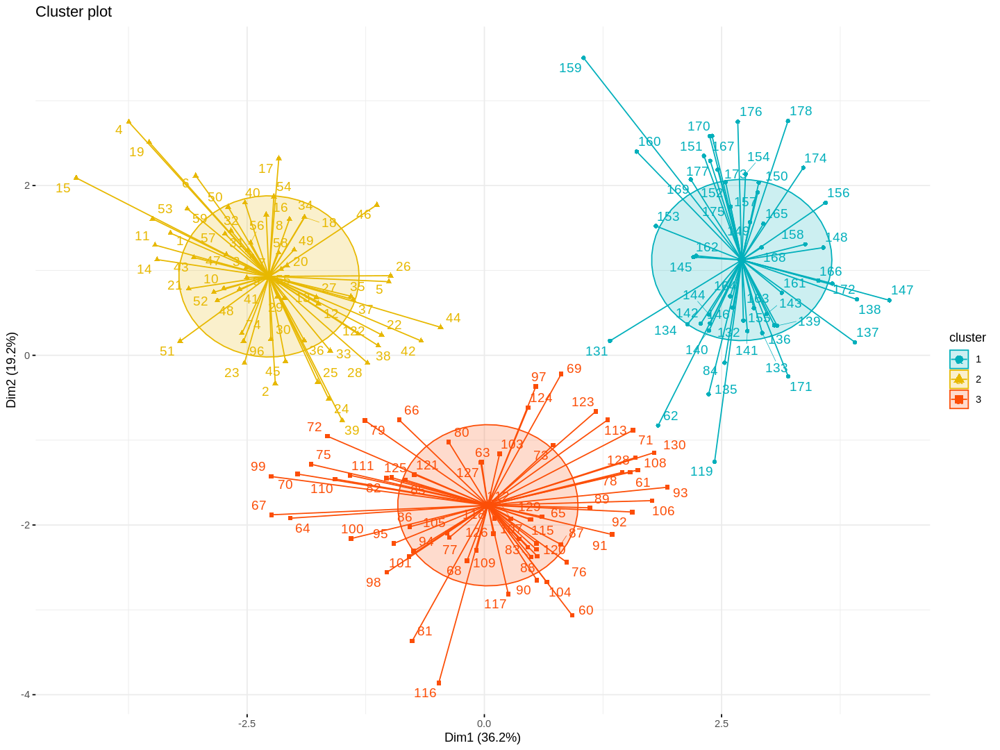

In [263]:
# visualising k-means result
options(repr.plot.width=12, repr.plot.height=9)

fviz_cluster(km.res, data = data.scaled,
palette = c( "#00AFBB", "#E7B800", "#FC4E07"),
ellipse.type = "euclid", # Concentration ellipse
star.plot = TRUE, # Add segments from centroids to items
repel = TRUE, # Avoid label overplotting (slow)
ggtheme = theme_minimal())

Clustered data set:-

In [320]:
# making cluster as factor
km.res$cluster <- as.factor(km.res$cluster)

# assining cluster to the original wine data set
data.clust.kmeans <- cbind(data, cluster = km.res$cluster)

# viewing the head ogf the clustered dataset
head(data.clust.kmeans)%>%kable()



| Alcohol| Malic.acid|  Ash| Alcalinity.of.ash| Magnesium| Total.phenols| Flavanoids| Nonflavanoid.phenols| Proanthocyanins| Color.intensity|  Hue| OD280.OD315.of.diluted.wines| Proline|cluster |
|-------:|----------:|----:|-----------------:|---------:|-------------:|----------:|--------------------:|---------------:|---------------:|----:|----------------------------:|-------:|:-------|
|   14.23|       1.71| 2.43|              15.6|       127|          2.80|       3.06|                 0.28|            2.29|            5.64| 1.04|                         3.92|    1065|2       |
|   13.20|       1.78| 2.14|              11.2|       100|          2.65|       2.76|                 0.26|            1.28|            4.38| 1.05|                         3.40|    1050|2       |
|   13.16|       2.36| 2.67|              18.6|       101|          2.80|       3.24|                 0.30|            2.81|            5.68| 1.03|                         3.17|    1185|2       |
|   14.37|       1

Aggregate (mean) table by cluster:-

In [319]:
aggar.kmeans <- aggregate(data.clust.kmeans[,1:13], by=list(data.clust.kmeans$cluster), mean) %>% as.data.frame()
aggar.kmeans%>%kable()



|Group.1 |  Alcohol| Malic.acid|      Ash| Alcalinity.of.ash| Magnesium| Total.phenols| Flavanoids| Nonflavanoid.phenols| Proanthocyanins| Color.intensity|       Hue| OD280.OD315.of.diluted.wines|   Proline|
|:-------|--------:|----------:|--------:|-----------------:|---------:|-------------:|----------:|--------------------:|---------------:|---------------:|---------:|----------------------------:|---------:|
|1       | 13.13412|   3.307255| 2.417647|          21.24118|  98.66667|      1.683922|  0.8188235|            0.4519608|        1.145882|        7.234706| 0.6919608|                     1.696667|  619.0588|
|2       | 13.67677|   1.997903| 2.466290|          17.46290| 107.96774|      2.847581|  3.0032258|            0.2920968|        1.922097|        5.453548| 1.0654839|                     3.163387| 1100.2258|
|3       | 12.25092|   1.897385| 2.231231|          20.06308|  92.73846|      2.247692|  2.0500000|            0.3576923|        1.624154|        2.973077| 1.0627077|

Visualizing the clustered data:-

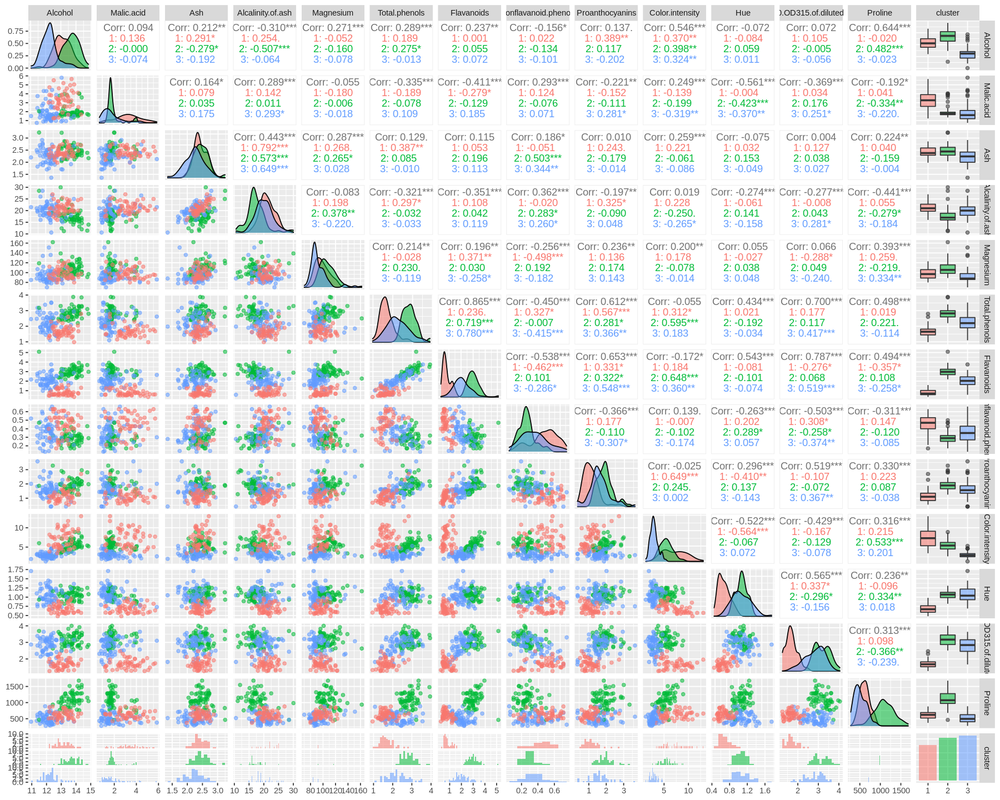

In [277]:
options(repr.plot.width=15, repr.plot.height=12)
suppressWarnings( ggpairs(data.clust.kmeans,aes(color=cluster, alpha=0.5),lower = list(combo = wrap("facethist", binwidth = 0.1))))

# (06). K Medoids Clustering

Now I will do k-medoids clustering on wine dataset. The steps involve:-
1. Finding the optimum numbers of cluster for k-medoids
2. Next, will do the k-medoids clustering 
3. Next, will visualise the cluster
4. Next, will present the summary  

Note:- k-medoids algorithm is also known as PAM (partioning around medoids).

Optimum number of clusters for pam (Elbow method)

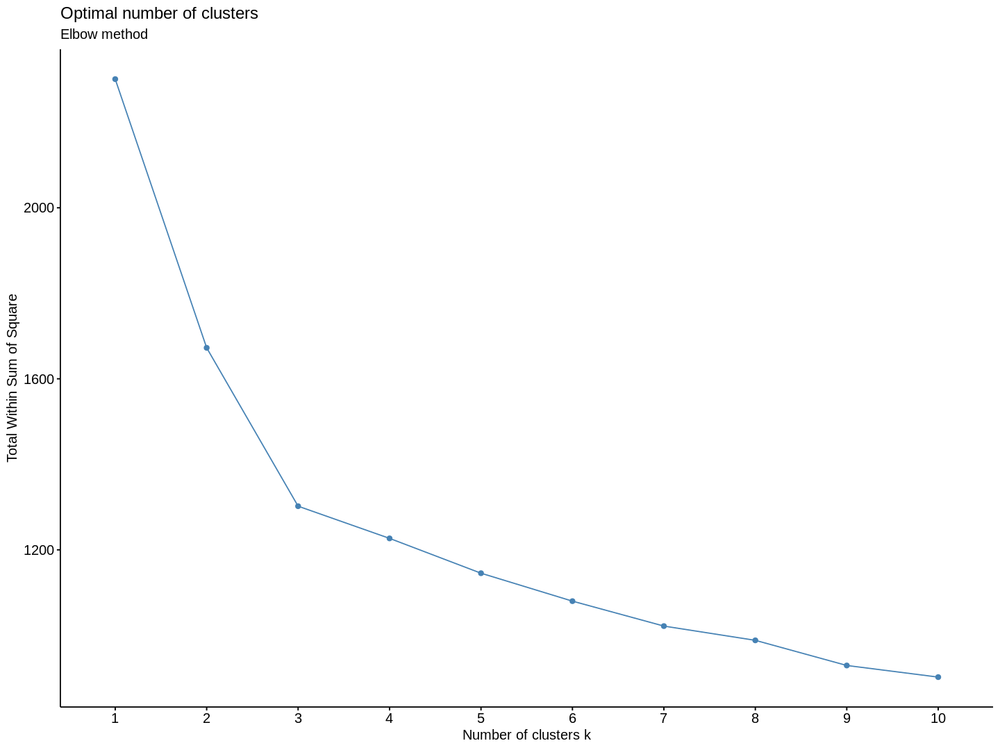

In [145]:
# Elbow method
library(cluster)
options(repr.plot.width=12, repr.plot.height=9)
fviz_nbclust(data.scaled, pam, method = "wss") +
labs(subtitle = "Elbow method")

Observation:- We can see elbow at k=3.

Modified plot:-

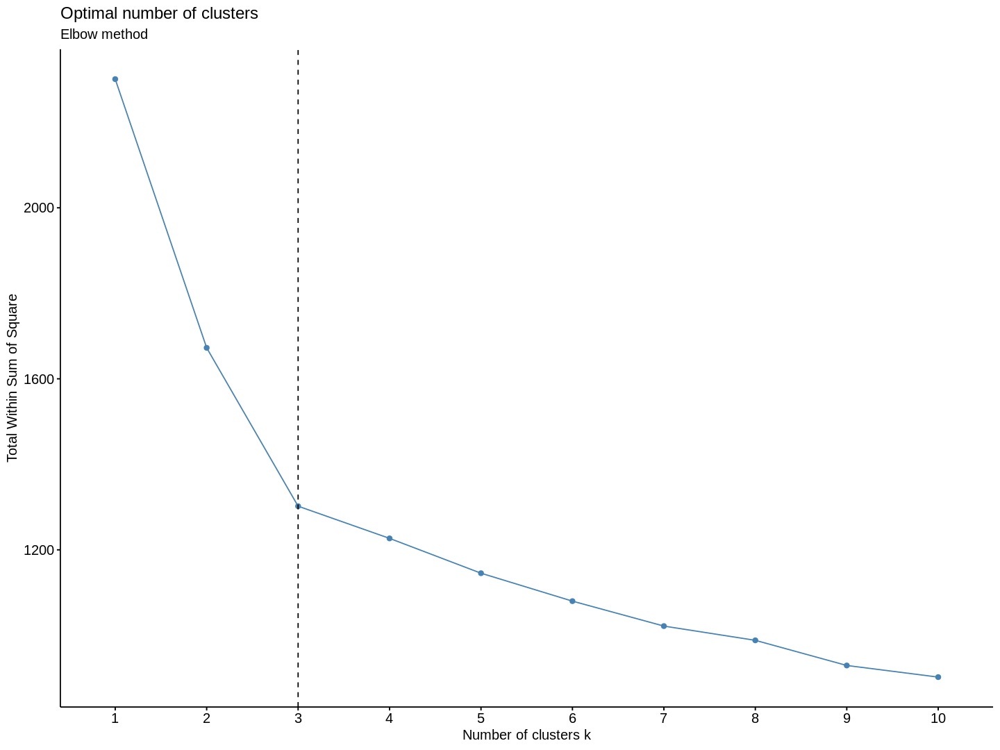

In [146]:
# Elbow method
options(repr.plot.width=12, repr.plot.height=9)
fviz_nbclust(data.scaled, pam, method = "wss") +
geom_vline(xintercept = 3, linetype = 2)+
labs(subtitle = "Elbow method")

Optimum number of cluster in pam (silhouette method):-

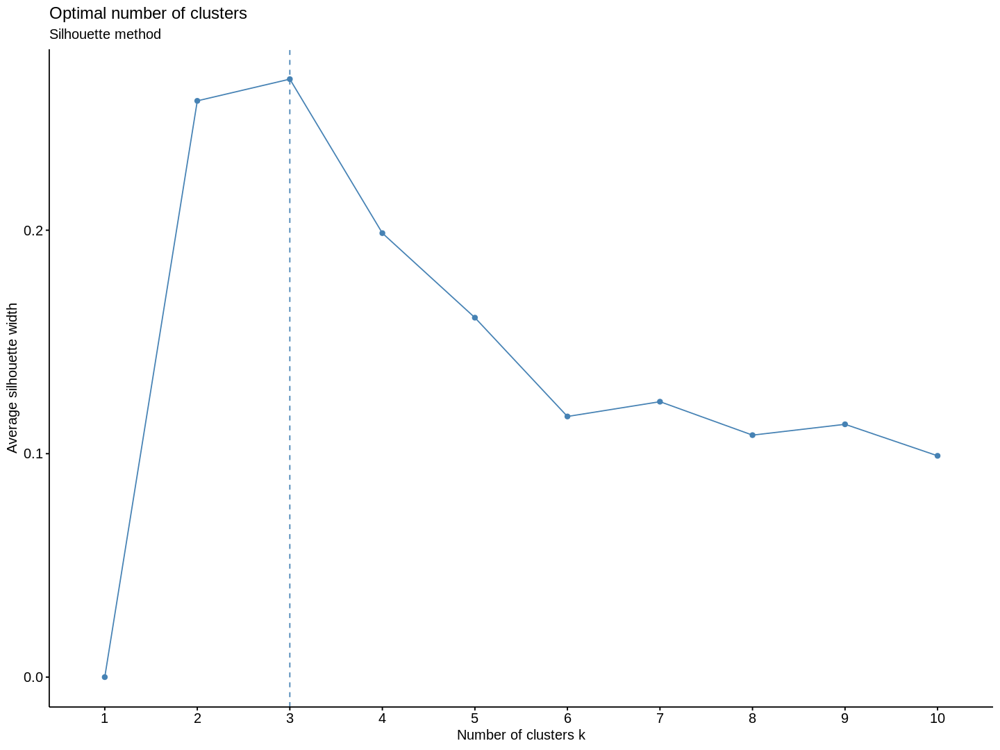

In [147]:
# Silhouette method
options(repr.plot.width=12, repr.plot.height=9)
fviz_nbclust(data.scaled, pam, method = "silhouette")+
labs(subtitle = "Silhouette method")

Optimum number of cluster in pam (Gap statistics):-

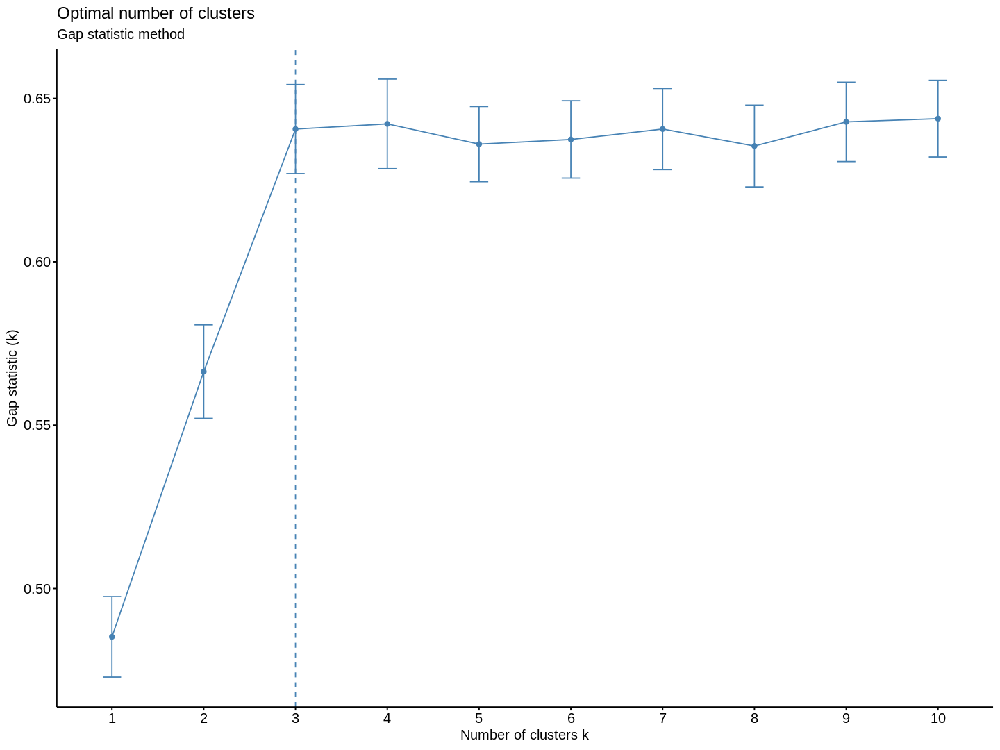

In [148]:
# Gap statistic
# nboot = 50 to keep the function speedy.
# recommended value: nboot= 500 for your analysis.
# Use verbose = FALSE to hide computing progression.
options(repr.plot.width=12, repr.plot.height=9)
set.seed(123)
fviz_nbclust(data.scaled, pam, nstart = 25, method = "gap_stat", nboot = 50)+
labs(subtitle = "Gap statistic method")

Observation:- We see that the above algorithm gives k=3 as the optimum numbers of clusters in the dataset for k-medoids clustering. 

Now I will do the k-medoids clustering:-

In [152]:
# pam with k=3

pam.res <- pam(data.scaled, 3)
print(pam.res)

Medoids:
      ID    Alcohol Malic.acid         Ash Alcalinity.of.ash   Magnesium
[1,]  36  0.5904981 -0.4711544  0.15849862         0.3009543  0.01809398
[2,] 107 -0.9246039 -0.5427655 -0.89856839        -0.1482061 -1.38222271
[3,] 149  0.3934117  0.8088930  0.04914686         0.6003946 -0.54203270
     Total.phenols    Flavanoids Nonflavanoid.phenols Proanthocyanins
[1,]     0.6469393  0.9518166597          -0.81841060      0.47016154
[2,]    -1.0307762  0.0007311716           0.06545479      0.06831575
[3,]    -0.5833854 -1.2707199546           0.70826598     -0.59560339
     Color.intensity        Hue OD280.OD315.of.diluted.wines    Proline
[1,]      0.01807806  0.3611585                    1.2089101  0.5497067
[2,]     -0.71522236  0.1861586                    0.7863692 -0.7522631
[3,]      1.45017064 -1.7825902                   -1.3967588 -0.3076880
Clustering vector:
  [1] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [38] 1 1 1 1 1 1 1 1 1 1 1 1 1 

Visualising k-medoids cluster:-

Warning message:
“ggrepel: 36 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


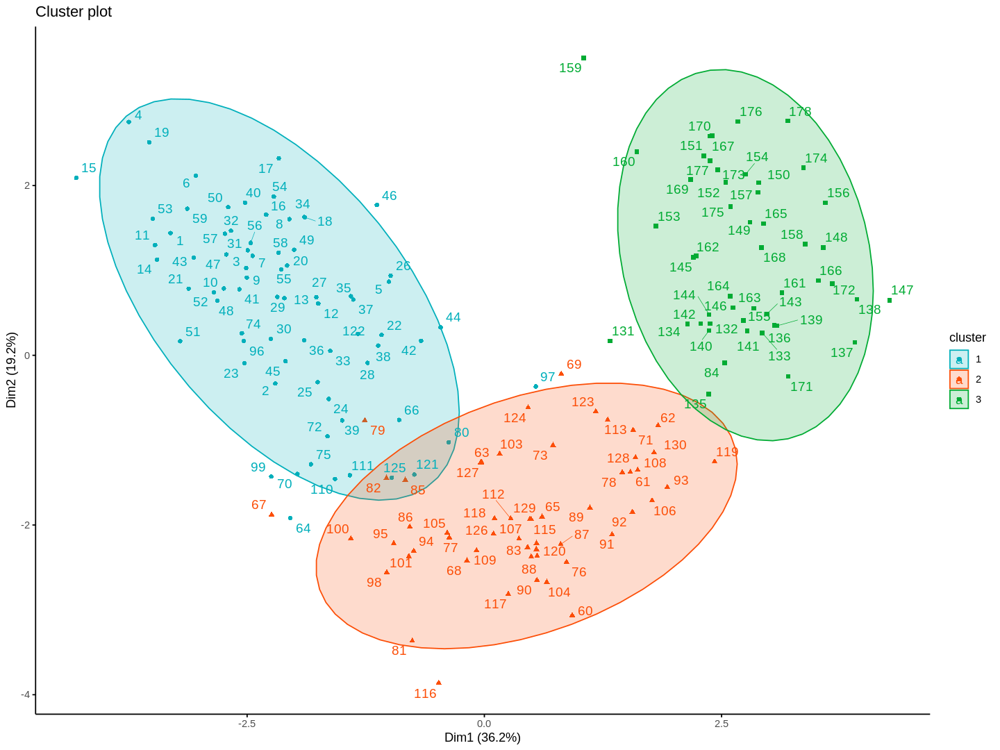

In [153]:
# visual;ising the clusters
options(repr.plot.width=12, repr.plot.height=9)
fviz_cluster(pam.res,
palette = c("#00AFBB", "#FC4E07","#00AB33"), # color palette
ellipse.type = "t", # Concentration ellipse
repel = TRUE, # Avoid label overplotting (slow)
ggtheme = theme_classic()
)

Clustered data set:-

In [318]:
# making cluster as factor
pam.res$cluster <- as.factor(pam.res$cluster)

# assining cluster to the original wine data set
data.clust.pam <- cbind(data, cluster = pam.res$cluster)

# viewing the head ogf the clustered dataset
head(data.clust.pam)%>%kable()



| Alcohol| Malic.acid|  Ash| Alcalinity.of.ash| Magnesium| Total.phenols| Flavanoids| Nonflavanoid.phenols| Proanthocyanins| Color.intensity|  Hue| OD280.OD315.of.diluted.wines| Proline|cluster |
|-------:|----------:|----:|-----------------:|---------:|-------------:|----------:|--------------------:|---------------:|---------------:|----:|----------------------------:|-------:|:-------|
|   14.23|       1.71| 2.43|              15.6|       127|          2.80|       3.06|                 0.28|            2.29|            5.64| 1.04|                         3.92|    1065|1       |
|   13.20|       1.78| 2.14|              11.2|       100|          2.65|       2.76|                 0.26|            1.28|            4.38| 1.05|                         3.40|    1050|1       |
|   13.16|       2.36| 2.67|              18.6|       101|          2.80|       3.24|                 0.30|            2.81|            5.68| 1.03|                         3.17|    1185|1       |
|   14.37|       1

Aggreagate (mean) table by cluster:-

In [317]:
aggregate(data.clust.pam[,1:13], by=list(cluster=km.res$cluster), mean)%>%kable()



|cluster |  Alcohol| Malic.acid|      Ash| Alcalinity.of.ash| Magnesium| Total.phenols| Flavanoids| Nonflavanoid.phenols| Proanthocyanins| Color.intensity|       Hue| OD280.OD315.of.diluted.wines|   Proline|
|:-------|--------:|----------:|--------:|-----------------:|---------:|-------------:|----------:|--------------------:|---------------:|---------------:|---------:|----------------------------:|---------:|
|1       | 13.13412|   3.307255| 2.417647|          21.24118|  98.66667|      1.683922|  0.8188235|            0.4519608|        1.145882|        7.234706| 0.6919608|                     1.696667|  619.0588|
|2       | 13.67677|   1.997903| 2.466290|          17.46290| 107.96774|      2.847581|  3.0032258|            0.2920968|        1.922097|        5.453548| 1.0654839|                     3.163387| 1100.2258|
|3       | 12.25092|   1.897385| 2.231231|          20.06308|  92.73846|      2.247692|  2.0500000|            0.3576923|        1.624154|        2.973077| 1.0627077|

Visualising the clustered data:-

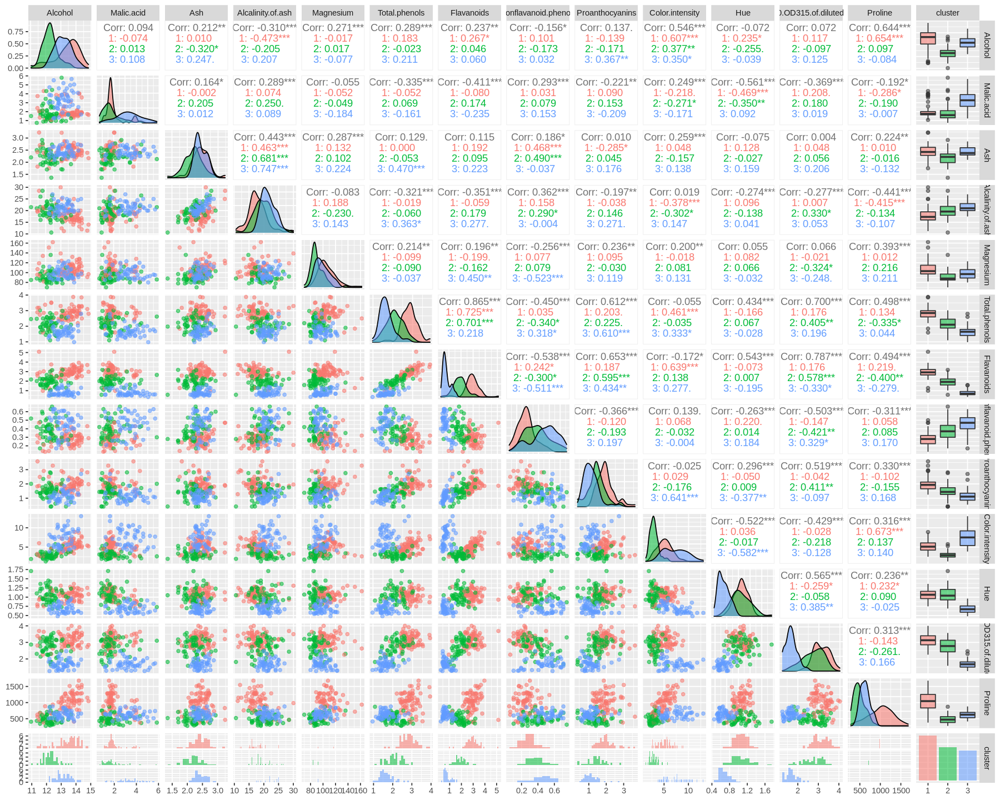

In [276]:
options(repr.plot.width=15, repr.plot.height=12)
suppressMessages( ggpairs(data.clust.pam,aes(color=cluster, alpha=0.5),lower = list(combo = wrap("facethist", binwidth = 0.1))))

# (07). Gaussian mixture model clustering:-

Now I will do gaussian mixture model clustering on wine dataset. The steps involve:-
1. I will use Mclust() function from mclust package. It automatically finds a optimum k (number of cluster) and assigns the cluster to the observations.
2. Next, will visualise the cluster
3. Next, will present the summary  

In [171]:
# model based clustering

#install.packages("mclust")
library(mclust)
mc<-Mclust(data.scaled)
summary(mc)

Package 'mclust' version 5.4.9
Type 'citation("mclust")' for citing this R package in publications.



---------------------------------------------------- 
Gaussian finite mixture model fitted by EM algorithm 
---------------------------------------------------- 

Mclust VVE (ellipsoidal, equal orientation) model with 3 components: 

 log-likelihood   n  df       BIC       ICL
      -2292.553 178 158 -5403.829 -5404.793

Clustering table:
 1  2  3 
56 73 49 

Optimum cluster:-

In [172]:
mc$G

[1] 3

We see the optimum number of cluster made is again k=3.

Visualising the clusters:-

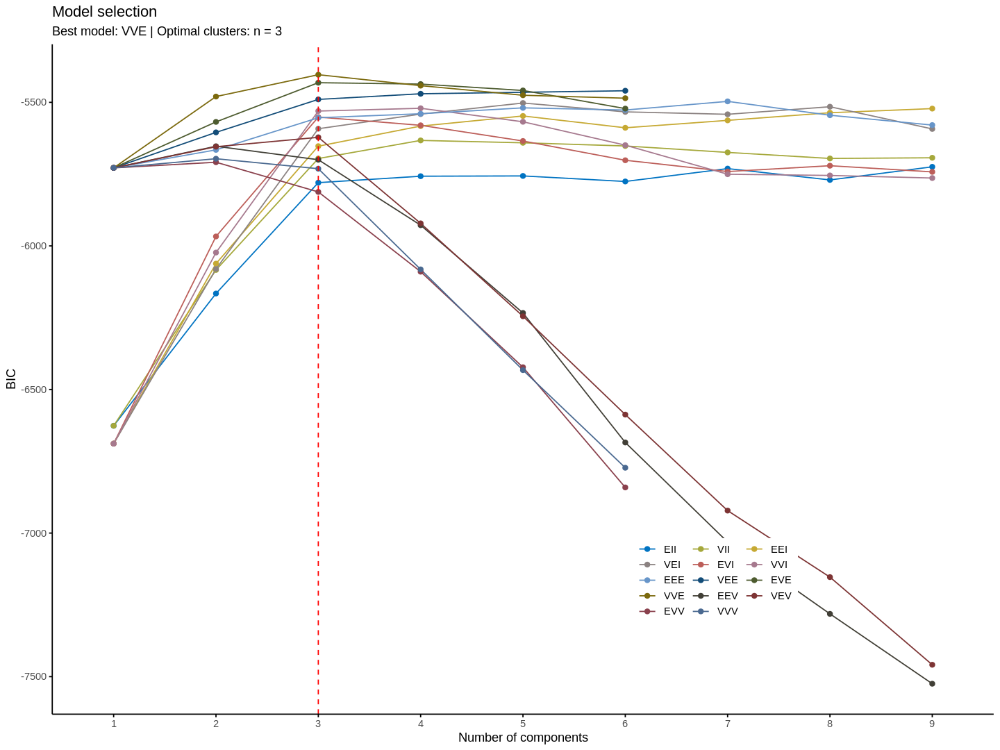

In [173]:
# visualisation
library(factoextra)
options(repr.plot.width=12, repr.plot.height=9)

# BIC values used for choosing the number of clusters
fviz_mclust(mc, "BIC", palette = "jco")

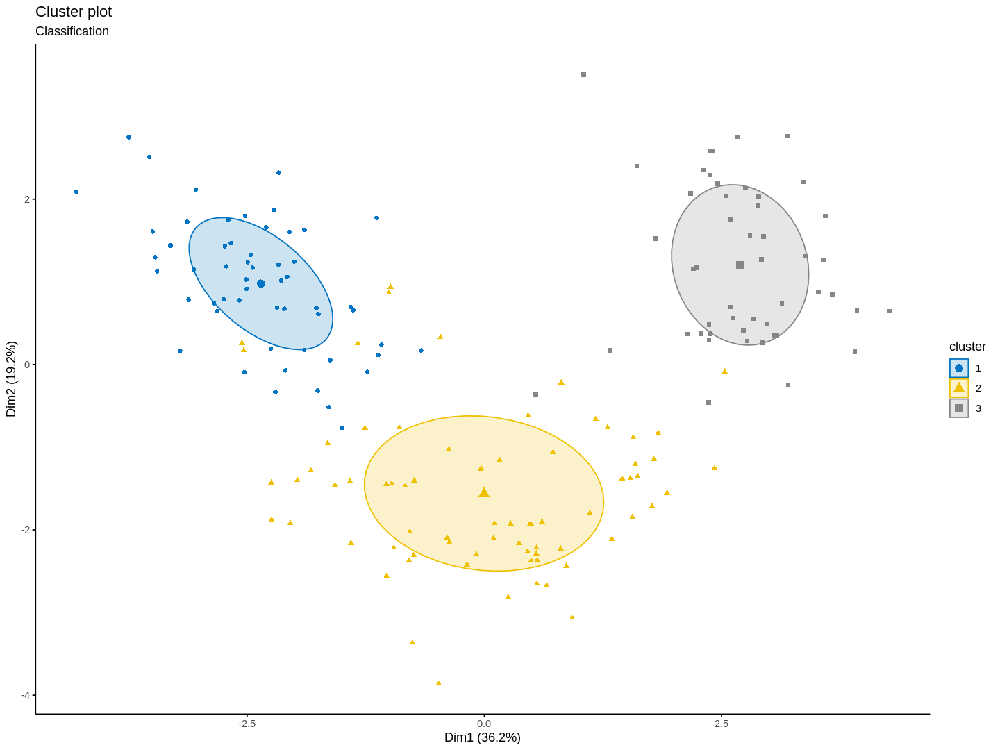

In [243]:
# Classification: plot showing the clustering
options(repr.plot.width=12, repr.plot.height=9)
fviz_mclust(mc, "classification", geom = "point",pointsize = 1.5, palette = "jco")

Clustered data set:-

In [316]:
# making cluster as factor
mc$classification <- as.factor(mc$classification)

# assining cluster to the original wine data set
data.clust.gmm <- cbind(data, cluster = mc$classification)

# viewing the head ogf the clustered dataset
head(data.clust.gmm)%>%kable()



| Alcohol| Malic.acid|  Ash| Alcalinity.of.ash| Magnesium| Total.phenols| Flavanoids| Nonflavanoid.phenols| Proanthocyanins| Color.intensity|  Hue| OD280.OD315.of.diluted.wines| Proline|cluster |
|-------:|----------:|----:|-----------------:|---------:|-------------:|----------:|--------------------:|---------------:|---------------:|----:|----------------------------:|-------:|:-------|
|   14.23|       1.71| 2.43|              15.6|       127|          2.80|       3.06|                 0.28|            2.29|            5.64| 1.04|                         3.92|    1065|1       |
|   13.20|       1.78| 2.14|              11.2|       100|          2.65|       2.76|                 0.26|            1.28|            4.38| 1.05|                         3.40|    1050|1       |
|   13.16|       2.36| 2.67|              18.6|       101|          2.80|       3.24|                 0.30|            2.81|            5.68| 1.03|                         3.17|    1185|1       |
|   14.37|       1

Aggregate (mean) table by cluster:-

In [315]:
aggregate(data.clust.gmm[,1:13], by=list(data.clust.gmm$cluster), mean)%>%kable()



|Group.1 |  Alcohol| Malic.acid|      Ash| Alcalinity.of.ash| Magnesium| Total.phenols| Flavanoids| Nonflavanoid.phenols| Proanthocyanins| Color.intensity|       Hue| OD280.OD315.of.diluted.wines|   Proline|
|:-------|--------:|----------:|--------:|-----------------:|---------:|-------------:|----------:|--------------------:|---------------:|---------------:|---------:|----------------------------:|---------:|
|1       | 13.77518|   1.964464| 2.437500|          16.81607| 105.87500|      2.848214|  2.9992857|            0.2844643|        1.904643|        5.605536| 1.0655357|                     3.163929| 1135.3929|
|2       | 12.32205|   1.968767| 2.260548|          20.25890|  94.84932|      2.285616|  2.1198630|            0.3679452|        1.638219|        3.135753| 1.0552877|                     2.803151|  527.4658|
|3       | 13.12633|   3.308980| 2.443265|          21.41837| 100.02041|      1.677143|  0.7857143|            0.4412245|        1.161837|        7.296327| 0.6881633|

Visualising the clustered data:-

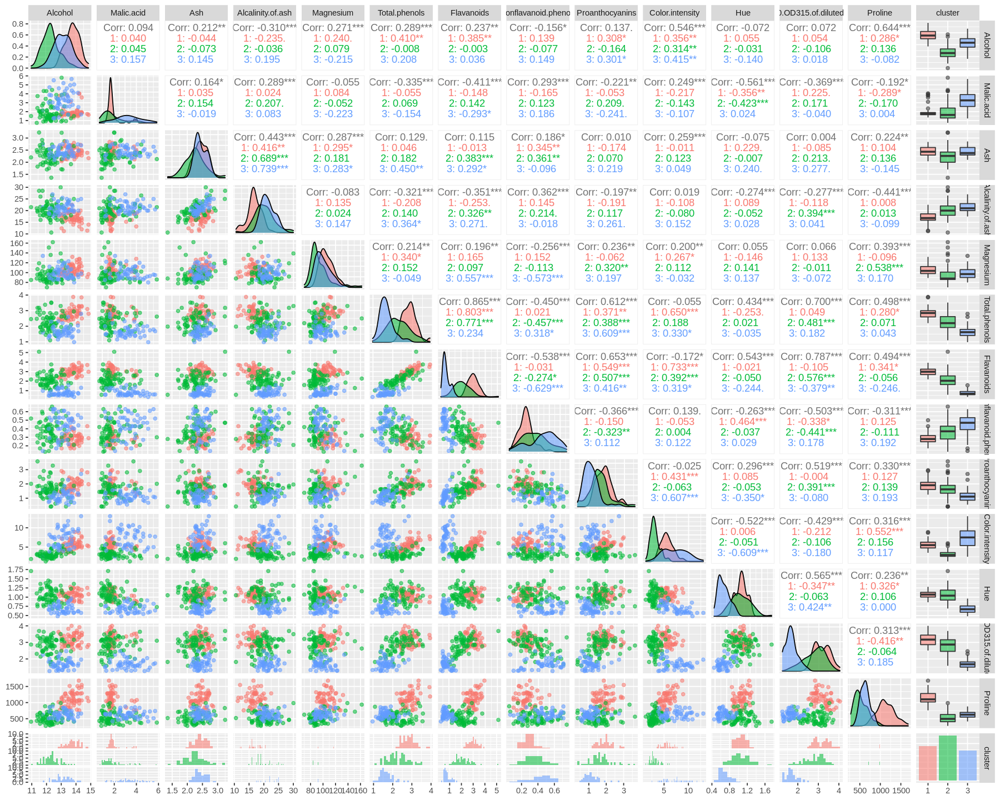

In [278]:
options(repr.plot.width=15, repr.plot.height=12)
suppressMessages( ggpairs(data.clust.gmm,aes(color=cluster, alpha=0.5),lower = list(combo = wrap("facethist", binwidth = 0.1))))

# (08). Hierarchical clustering

I will use the following things for the sake of simplicity. Method for distance matrix:-
Euclidean
Linkage method in clustering algorithm:-
1. Complete
2. WARD.D2
3. Average  
Linkage method affects the optimum number of clusters but the above mentioned method are more consisitent and more widely used. Hence I will stick with that as of now.
- First I will find out the optimum number of cluster for the above mentioned linkage method, 
- Then will do the clustering
- Then will visualise the cluster (dendrogram)
- Then will assign the cluster to the original data set
- Then I will present the aggregate table

Optimum number of cluster for hierarchical clustering by Elbow method:-

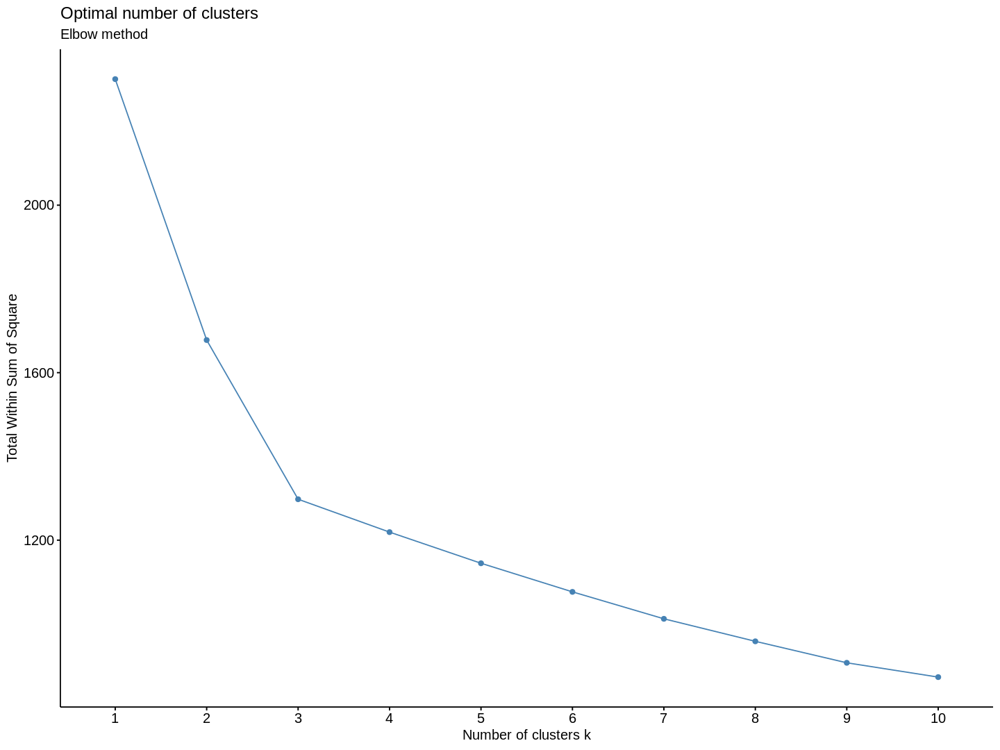

In [156]:
# Elbow method
options(repr.plot.width=12, repr.plot.height=9)
fviz_nbclust(data.scaled, hcut, method = "wss") +
labs(subtitle = "Elbow method")

Observation :- We see overall optimum number of cluster is 3 in hierarchical clustering too.

Modified plot:-

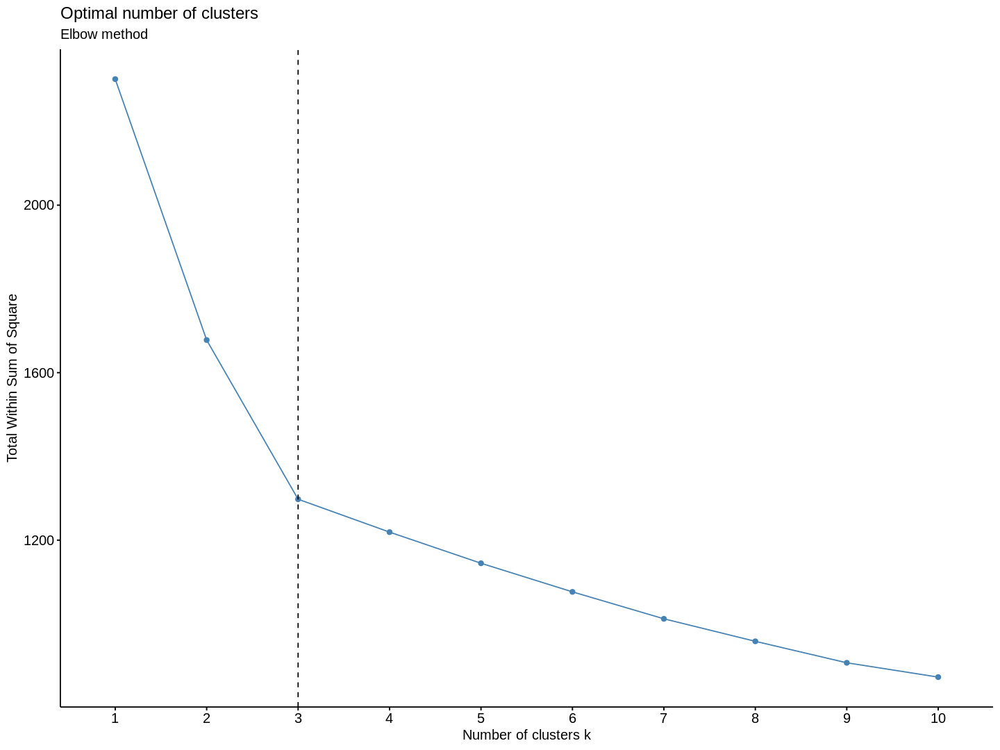

In [157]:
# Elbow method
options(repr.plot.width=12, repr.plot.height=9)
fviz_nbclust(data.scaled, hcut, method = "wss") +
geom_vline(xintercept = 3, linetype = 2)+
labs(subtitle = "Elbow method")

Optimum number of cluster for hierarchical cluistering by silhouette method:-

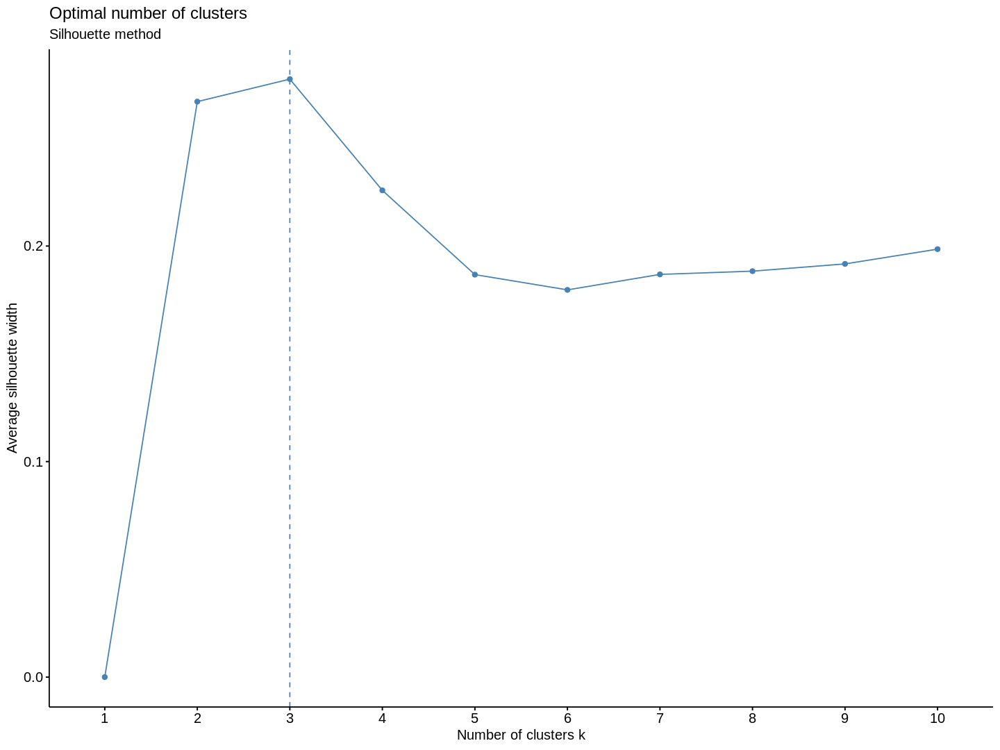

In [158]:
# Silhouette method
options(repr.plot.width=12, repr.plot.height=9)
fviz_nbclust(data.scaled, hcut, method = "silhouette")+
labs(subtitle = "Silhouette method")

Optimum number of cluster for hierarchical clustering by Gap statistics method:-

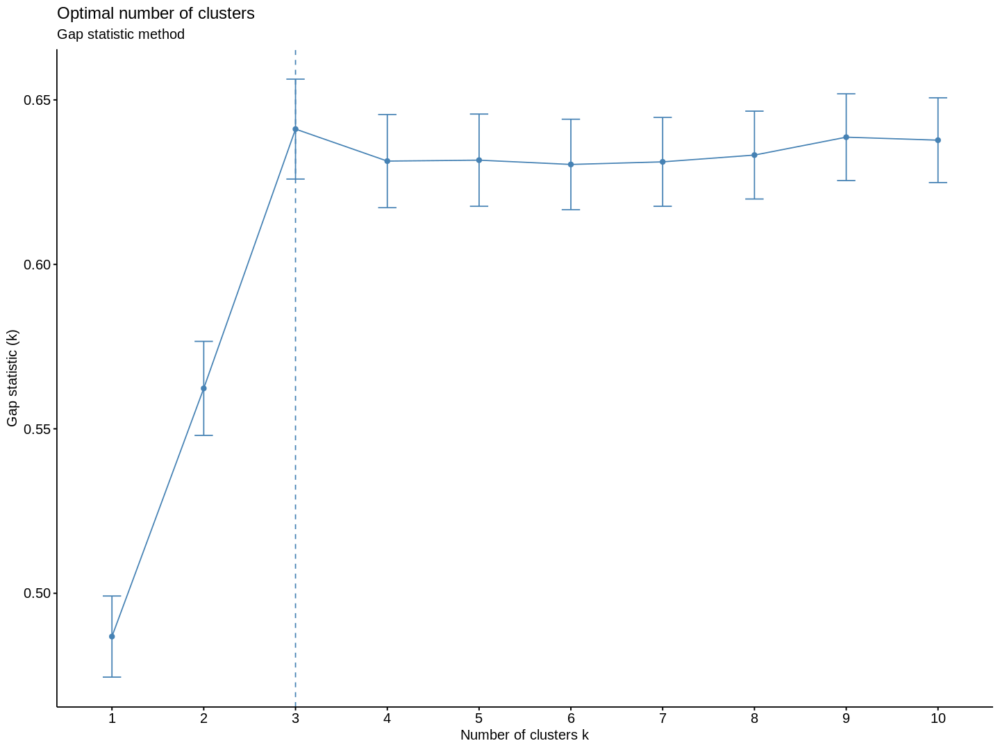

In [159]:
# Gap statistic
# nboot = 50 to keep the function speedy.
# recommended value: nboot= 500 for your analysis.
# Use verbose = FALSE to hide computing progression.
set.seed(123)
options(repr.plot.width=12, repr.plot.height=9)
fviz_nbclust(data.scaled, hcut, nstart = 25, method = "gap_stat", nboot = 50)+
labs(subtitle = "Gap statistic method")

Observation:- We see that overall optimum cluster seems to be 3 in the case of hierarchica clustering as well.

Now I will explore the optimum clustering more deeply in terms of specific linkage by NbClust package.

Optimum number of cluster in hierarchical clustering for "complete linkage" by majority rule:-

*** : The Hubert index is a graphical method of determining the number of clusters.
                In the plot of Hubert index, we seek a significant knee that corresponds to a 
                significant increase of the value of the measure i.e the significant peak in Hubert
                index second differences plot. 
 


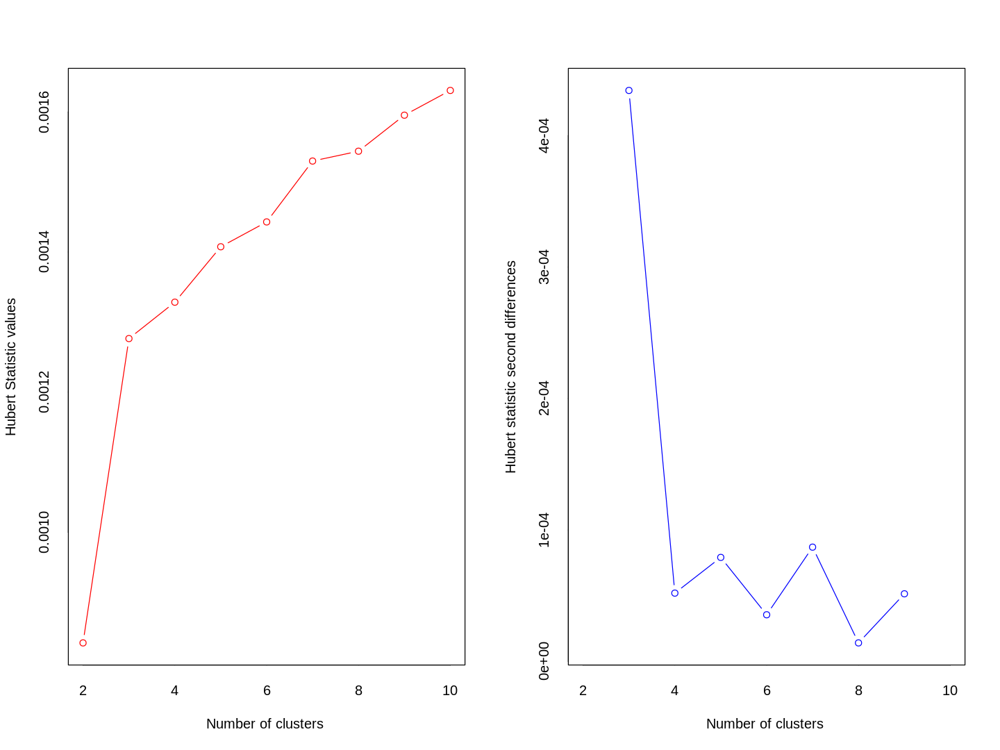

*** : The D index is a graphical method of determining the number of clusters. 
                In the plot of D index, we seek a significant knee (the significant peak in Dindex
                second differences plot) that corresponds to a significant increase of the value of
                the measure. 
 
******************************************************************* 
* Among all indices:                                                
* 1 proposed 2 as the best number of clusters 
* 11 proposed 3 as the best number of clusters 
* 5 proposed 5 as the best number of clusters 
* 2 proposed 8 as the best number of clusters 
* 1 proposed 9 as the best number of clusters 
* 3 proposed 10 as the best number of clusters 

                   ***** Conclusion *****                            
 
* According to the majority rule, the best number of clusters is  3 
 
 
******************************************************************* 
Among all indices: 
* 2 proposed  0 as the best numb

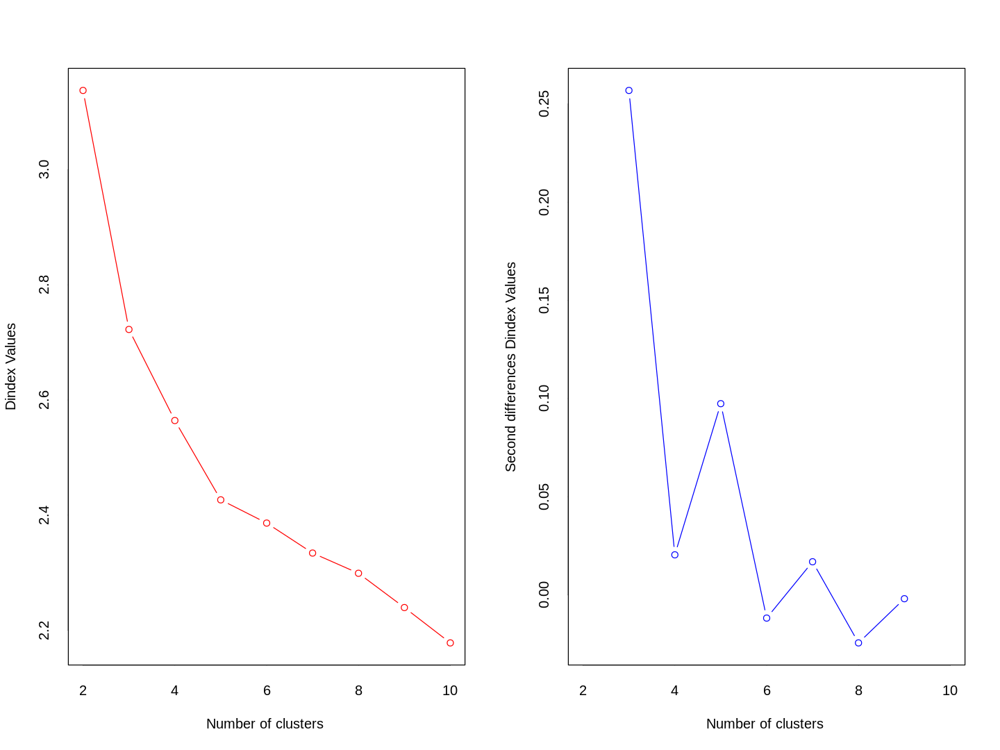

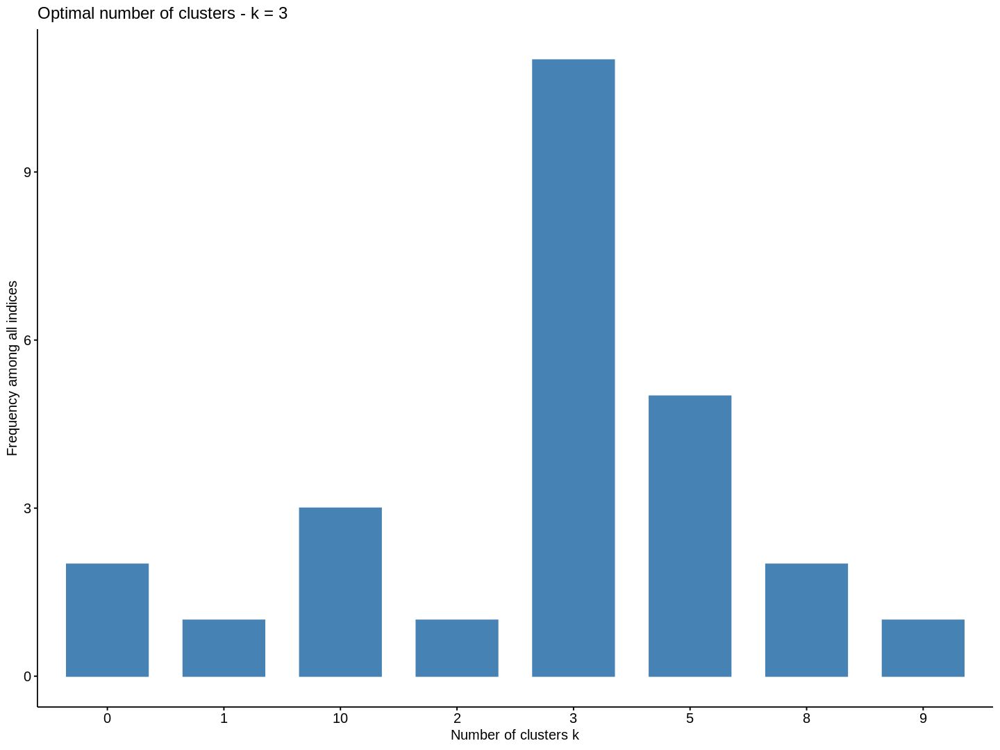

In [312]:
#optimum k
# complete linkage
options(repr.plot.width=12, repr.plot.height=9)
nb.complete <- NbClust(data.scaled, distance = "euclidean", min.nc = 2,
max.nc = 10, method = "complete")

# visualising the result
suppressWarnings( fviz_nbclust(nb.complete))

Observation :- Here too the optimum number of clusters comes as k=3.

Optimum number of cluster in hierarchical clustering for "ward linkage" by majority rule:-

*** : The Hubert index is a graphical method of determining the number of clusters.
                In the plot of Hubert index, we seek a significant knee that corresponds to a 
                significant increase of the value of the measure i.e the significant peak in Hubert
                index second differences plot. 
 


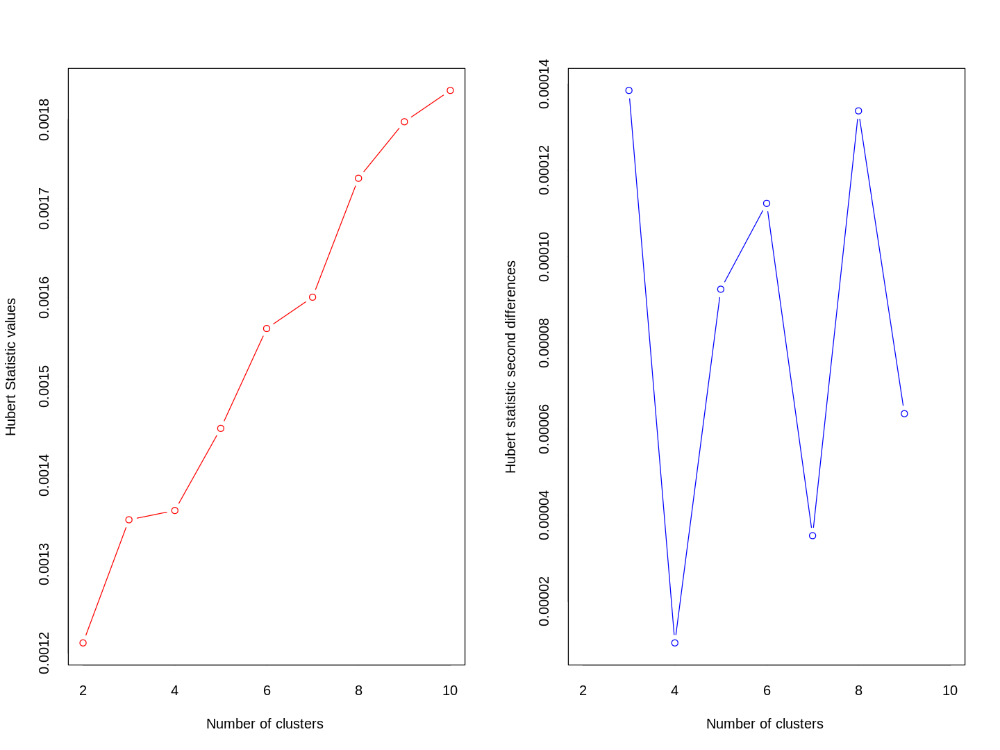

*** : The D index is a graphical method of determining the number of clusters. 
                In the plot of D index, we seek a significant knee (the significant peak in Dindex
                second differences plot) that corresponds to a significant increase of the value of
                the measure. 
 
******************************************************************* 
* Among all indices:                                                
* 2 proposed 2 as the best number of clusters 
* 17 proposed 3 as the best number of clusters 
* 1 proposed 6 as the best number of clusters 
* 2 proposed 10 as the best number of clusters 

                   ***** Conclusion *****                            
 
* According to the majority rule, the best number of clusters is  3 
 
 
******************************************************************* 
Among all indices: 
* 2 proposed  0 as the best number of clusters
* 1 proposed  1 as the best number of clusters
* 2 proposed  2 as the best numb

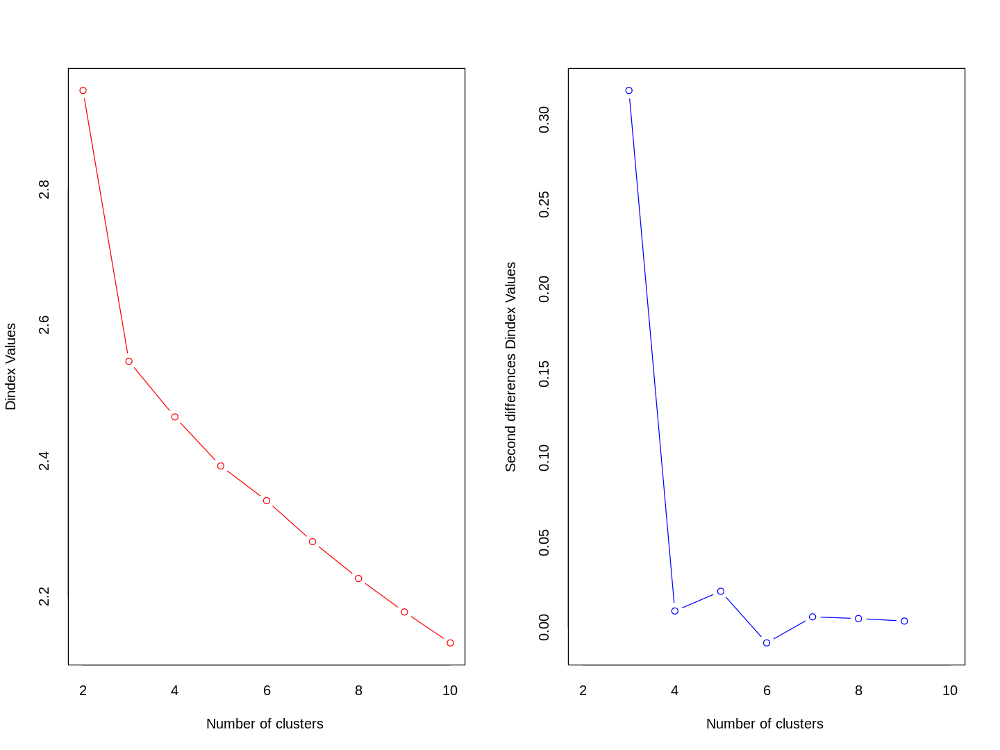

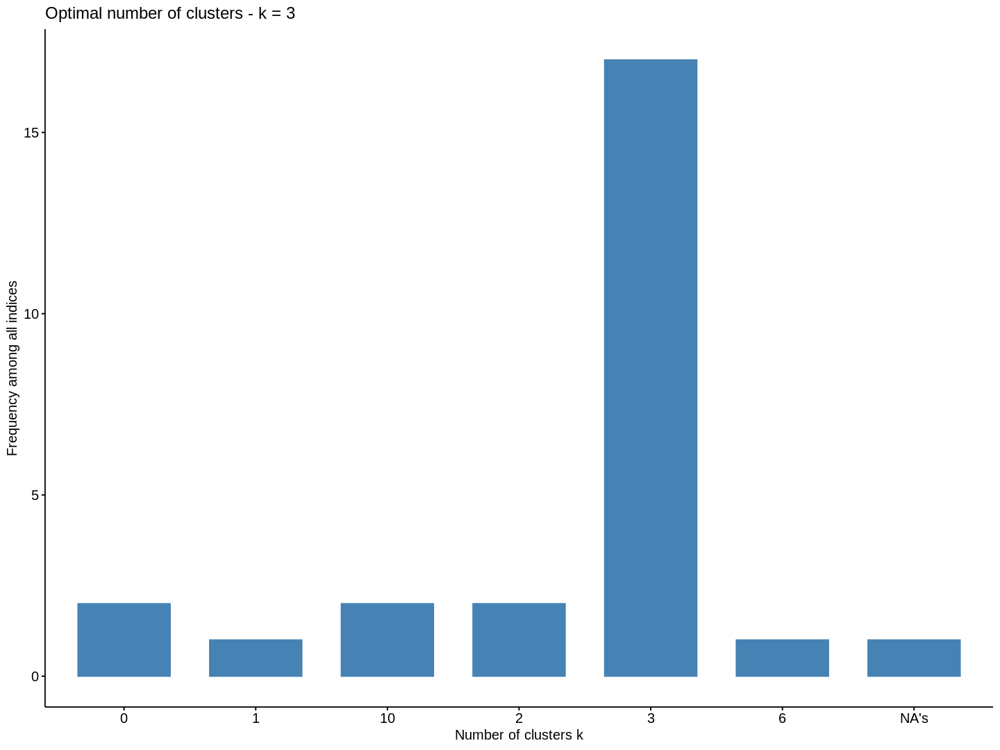

In [313]:
# ward linkage

nb.ward2 <- NbClust(data.scaled, distance = "euclidean", min.nc = 2,
max.nc = 10, method = "ward.D")
options(repr.plot.width=12, repr.plot.height=9)
# visualising the result
suppressWarnings( fviz_nbclust(nb.ward2))

Observation:- Again the optimum number of cluster comes as k=3.

Optimum number of cluster in hierarchical clustering for "average linkage" by majority rule:-

*** : The Hubert index is a graphical method of determining the number of clusters.
                In the plot of Hubert index, we seek a significant knee that corresponds to a 
                significant increase of the value of the measure i.e the significant peak in Hubert
                index second differences plot. 
 


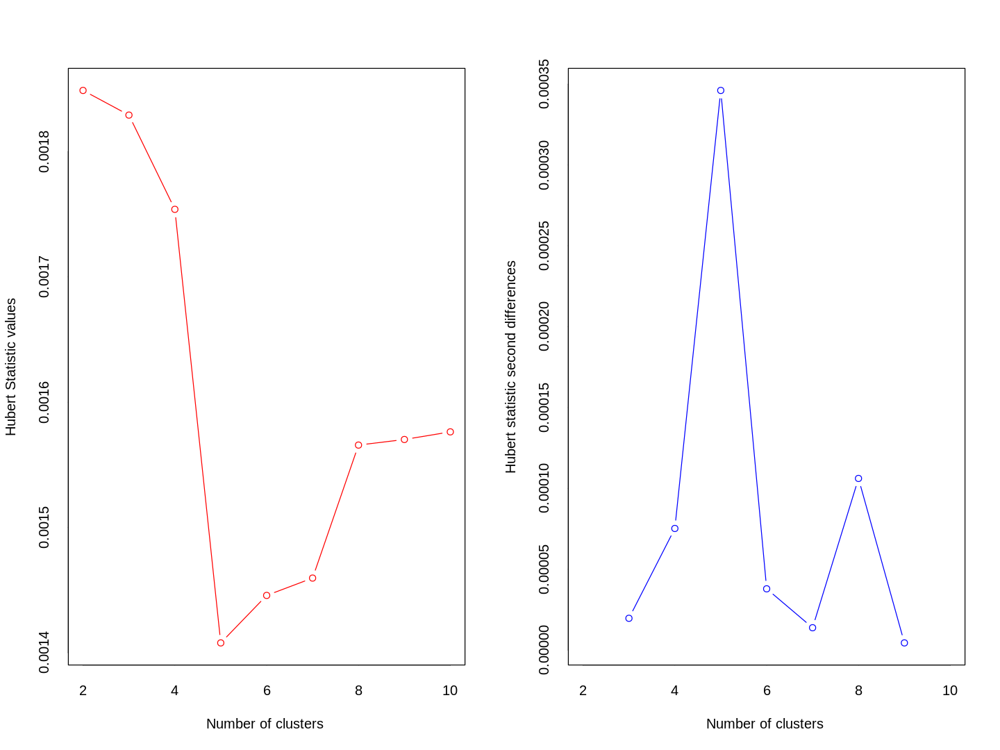

*** : The D index is a graphical method of determining the number of clusters. 
                In the plot of D index, we seek a significant knee (the significant peak in Dindex
                second differences plot) that corresponds to a significant increase of the value of
                the measure. 
 
******************************************************************* 
* Among all indices:                                                
* 7 proposed 2 as the best number of clusters 
* 2 proposed 3 as the best number of clusters 
* 5 proposed 5 as the best number of clusters 
* 7 proposed 8 as the best number of clusters 
* 1 proposed 9 as the best number of clusters 
* 2 proposed 10 as the best number of clusters 

                   ***** Conclusion *****                            
 
* According to the majority rule, the best number of clusters is  2 
 
 
******************************************************************* 
Among all indices: 
* 2 proposed  0 as the best numbe

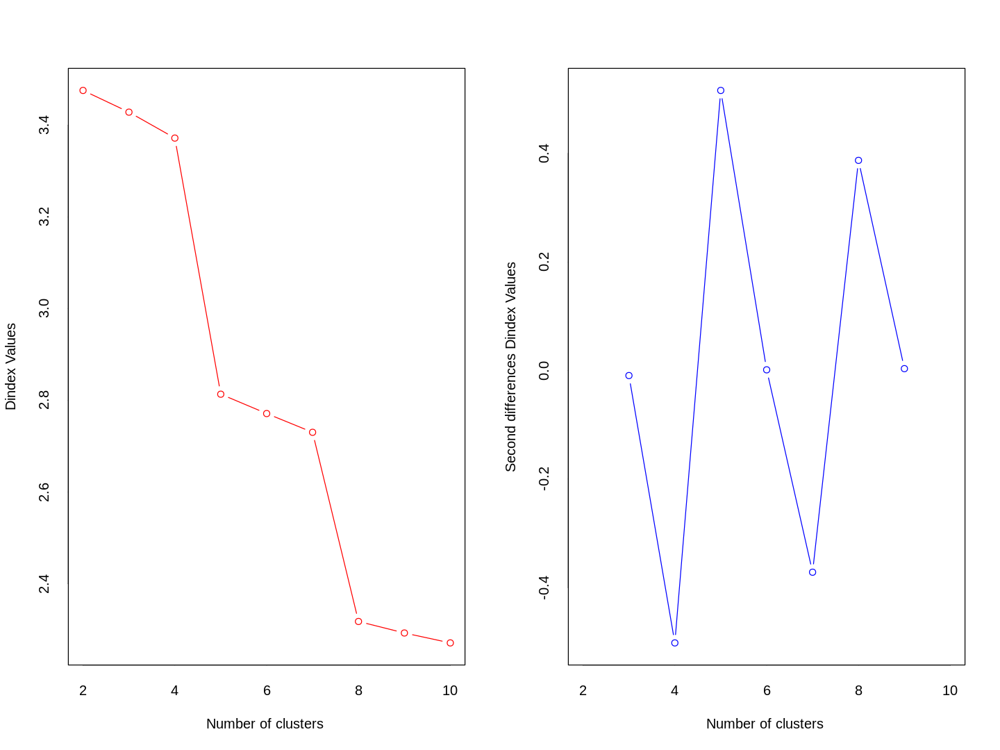

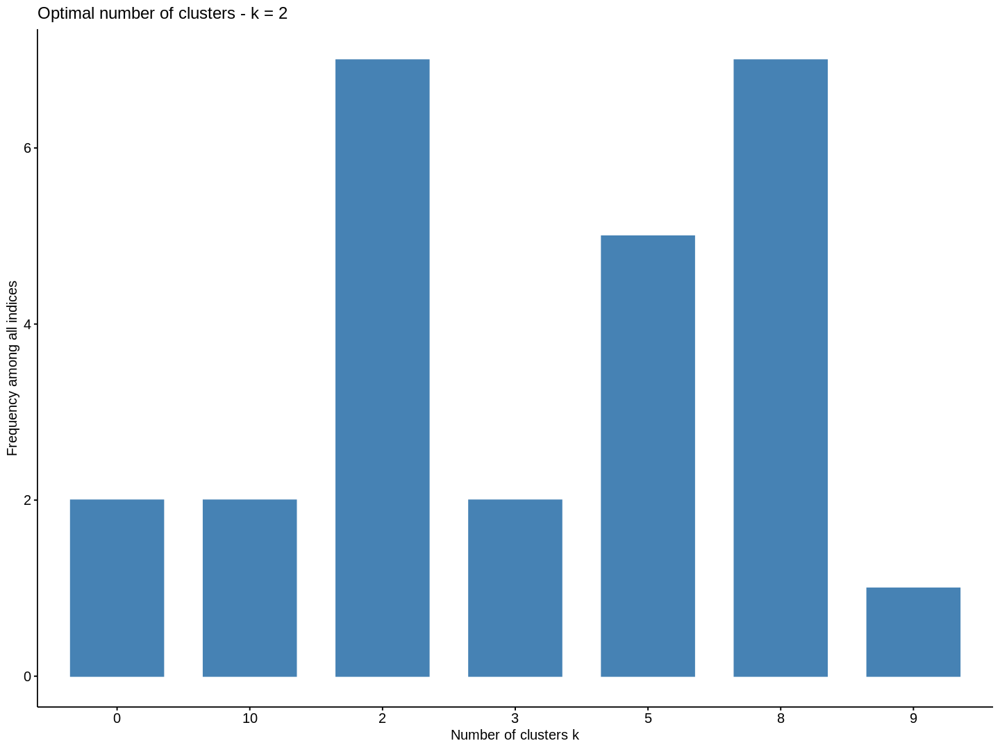

In [314]:
# average linkage

nb.avg <- NbClust(data.scaled, distance = "euclidean", min.nc = 2,
max.nc = 10, method = "average")
options(repr.plot.width=12, repr.plot.height=9)
# visualising the result
suppressWarnings(fviz_nbclust(nb.avg))

Observation :- Here the optimum number of cluster comes as k=2, although k=8 is also a good candidate to become optimum number. I will explore it more by visualising the dendrogram.

Now I will make the cluster according to the optimum k obtained and will visualise and cut the dendrogram accordingly.

doing the hierarchical clustering:-

In [291]:
# hierarchical clustering

# distance matrix
dist.mat <- dist(data.scaled, method = "euclidean")

# doing the hierarchical clustering for diffrent linkage
hc.comp<-hclust(dist.mat,method = "complete")
hc.ward<-hclust(dist.mat,method = "ward.D2")
hc.avg<-hclust(dist.mat,method = "average")

Ploting the dendrogram and the cluster:-

Complete linkage (k=3)

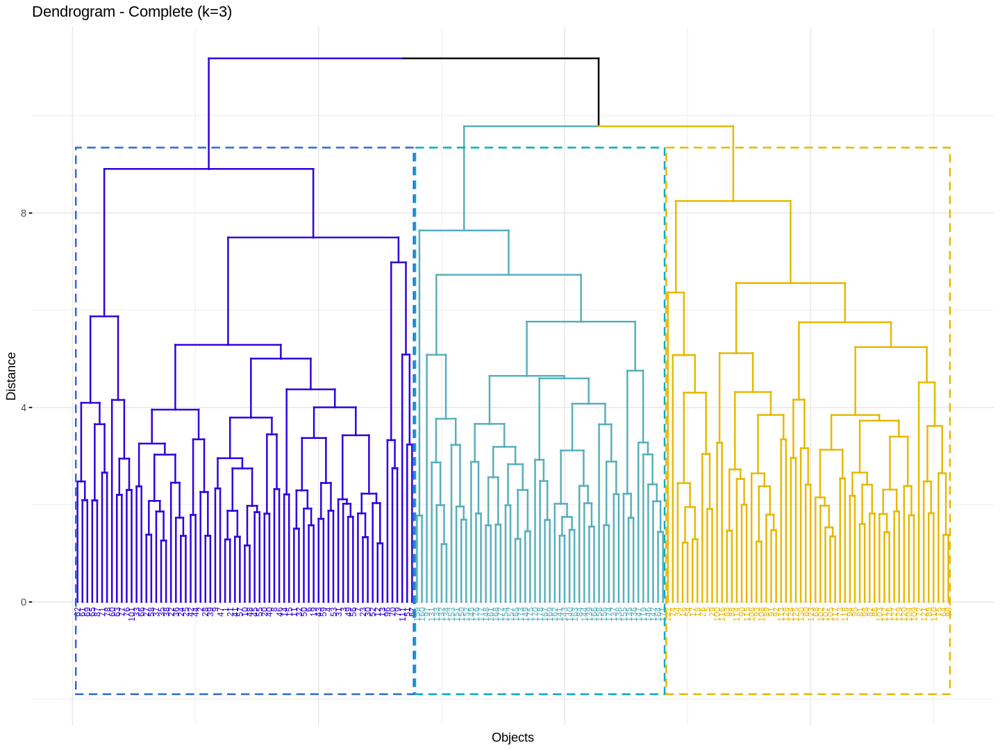

In [308]:
options(repr.plot.width=12, repr.plot.height=9)
par(mfrow=c(4,1))

# Complete linkage (k=3)
suppressWarnings(
# Cut in 3 groups and color by groups
fviz_dend(hc.comp, k = 3, # Cut in three groups
cex = 0.5, # label size
k_colors = c("#2E00DF", "#55AFBB", "#E7B800"),
color_labels_by_k = TRUE, # color labels by groups
rect = TRUE, # Add rectangle around groups
rect_border = c("#2E66DF", "#00AFBB", "#E7B800"),
rect_fill=F,
main = "Dendrogram - Complete (k=3)",
xlab = "Objects", ylab = "Distance", sub = "",
ggtheme = theme_minimal()
)
)

Ward.D2 linkage (k=3)

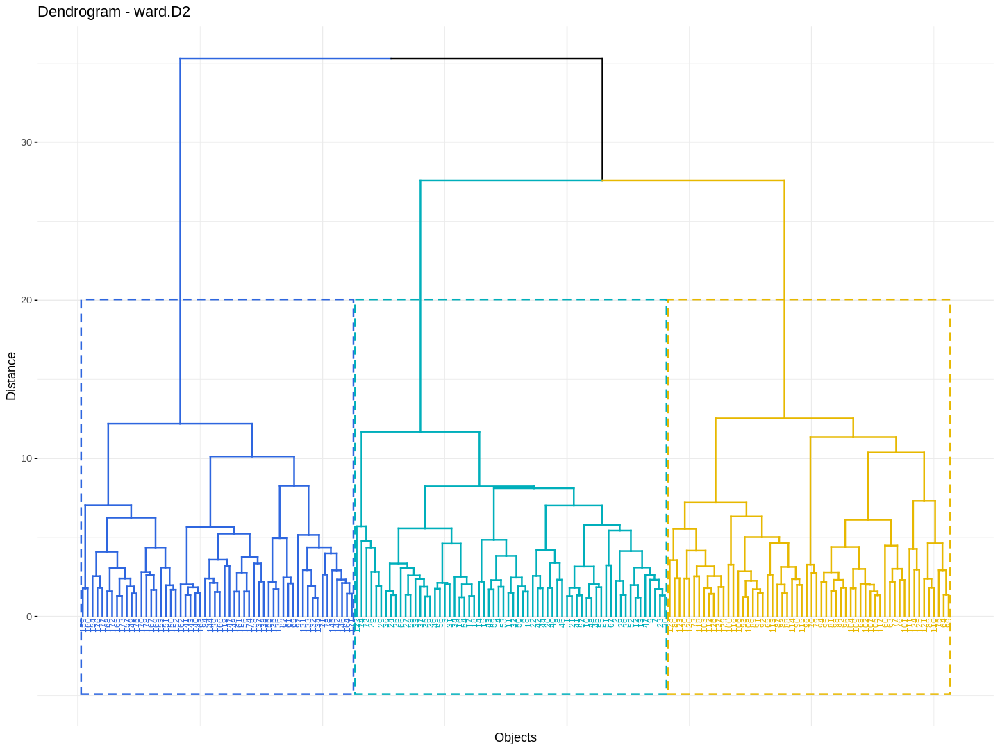

In [309]:
# Ward.D2 linkage (k=3)
suppressWarnings(
# Cut in 3 groups and color by groups
fviz_dend(hc.ward, k = 3, # Cut in three groups
cex = 0.5, # label size
k_colors = c("#2E66DF", "#00AFBB", "#E7B800"),
color_labels_by_k = TRUE, # color labels by groups
rect = TRUE, # Add rectangle around groups
rect_border = c("#2E66DF", "#00AFBB", "#E7B800"),
rect_fill = F,
main = "Dendrogram - ward.D2",
xlab = "Objects", ylab = "Distance", sub = "",
ggtheme = theme_minimal()
)
)

Average linkage (k=2)

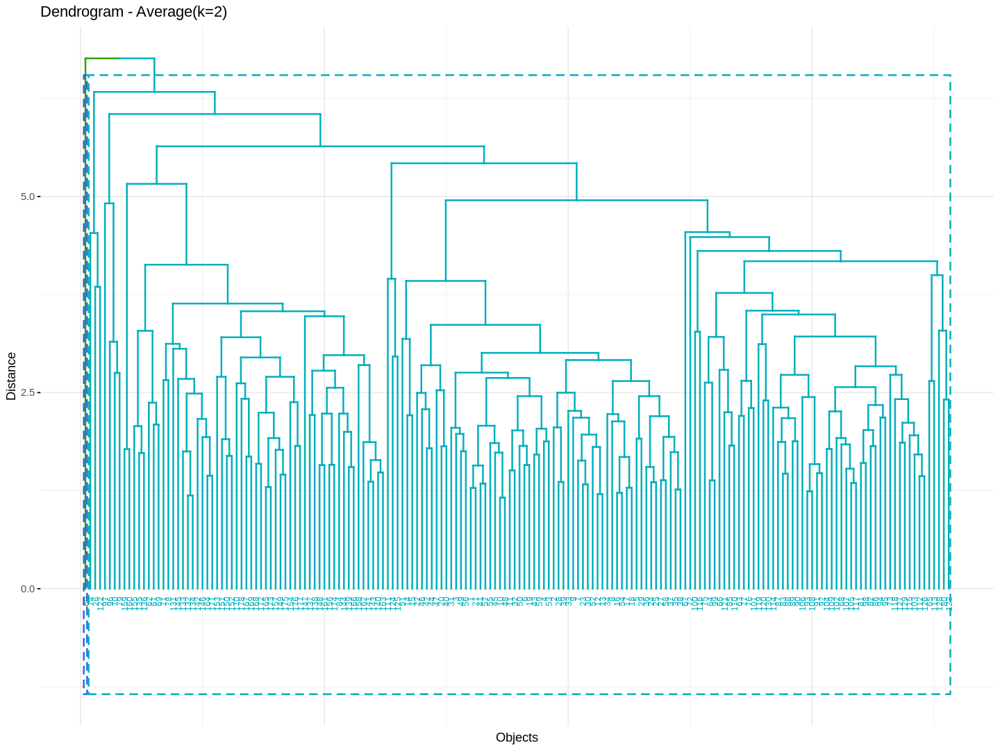

In [310]:
# Average linkage (k=2)
suppressWarnings(
# Cut in 2 groups and color by groups
fviz_dend(hc.avg, k = 2, # Cut in two groups
cex = 0.5, # label size
k_colors = c("#2E9F00", "#00AFBB"),
color_labels_by_k = TRUE, # color labels by groups
rect = TRUE, # Add rectangle around groups
rect_border = c("#2E66DF", "#00AFBB"),
rect_fill = F,
main = "Dendrogram - Average(k=2)",
xlab = "Objects", ylab = "Distance", sub = "",
ggtheme = theme_minimal()
)
)

Average linkage (k=8)

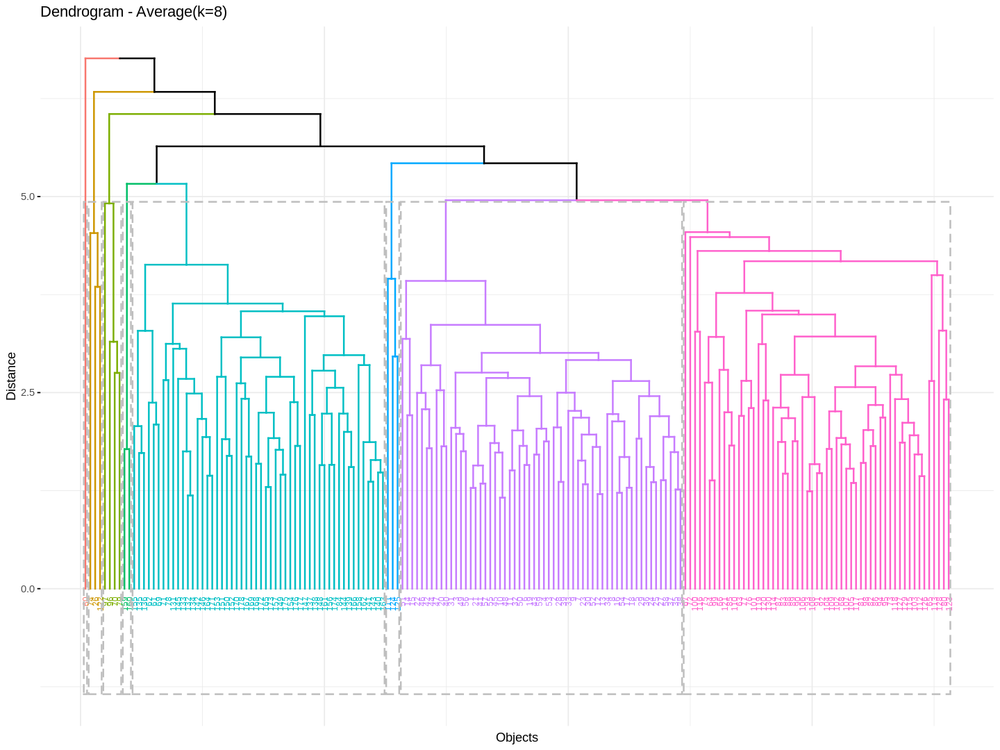

In [311]:
# Average linkage (k=8)
suppressWarnings(
# Cut in eight groups and color by groups
fviz_dend(hc.avg, k = 8, # Cut in eight groups
cex = 0.5, # label size
color_labels_by_k = TRUE, # color labels by groups
rect = TRUE, # Add rectangle around groups
rect_fill =F,
main = "Dendrogram - Average(k=8)",
xlab = "Objects", ylab = "Distance", sub = "",
ggtheme = theme_minimal()
)
)

Observation:-   
- We can see from dendrogram plot that the k=3 optimum makes more sense and seems the perfect number of cluster.
- Although I got k=2 and k=8 as optimum number of cluster for average linkage but from plot it is clear that k=3 cluster seems to be more accurate for this linkage too.
- So I will choose k=3 cluster as optimum for (in general) hierarchical clustering and do the further analysis.


Clustered data set:-

In [307]:
# cutting the dendrogram (complete linkage) at k=3
grp.comp <- cutree(hc.comp,3)

# making cluster as factor
grp.comp <- as.factor(grp.comp)

# assining cluster to the original wine data set
data.clust.hier <- cbind(data, cluster = grp.comp)

# viewing the head ogf the clustered dataset
head(data.clust.hier)%>%kable()



| Alcohol| Malic.acid|  Ash| Alcalinity.of.ash| Magnesium| Total.phenols| Flavanoids| Nonflavanoid.phenols| Proanthocyanins| Color.intensity|  Hue| OD280.OD315.of.diluted.wines| Proline|cluster |
|-------:|----------:|----:|-----------------:|---------:|-------------:|----------:|--------------------:|---------------:|---------------:|----:|----------------------------:|-------:|:-------|
|   14.23|       1.71| 2.43|              15.6|       127|          2.80|       3.06|                 0.28|            2.29|            5.64| 1.04|                         3.92|    1065|1       |
|   13.20|       1.78| 2.14|              11.2|       100|          2.65|       2.76|                 0.26|            1.28|            4.38| 1.05|                         3.40|    1050|1       |
|   13.16|       2.36| 2.67|              18.6|       101|          2.80|       3.24|                 0.30|            2.81|            5.68| 1.03|                         3.17|    1185|1       |
|   14.37|       1

Aggregate (mean) table by cluster:-

In [306]:
aggregate(data.clust.hier[,1:13], by=list(data.clust.hier$cluster), mean)%>%kable()



|Group.1 |  Alcohol| Malic.acid|      Ash| Alcalinity.of.ash| Magnesium| Total.phenols| Flavanoids| Nonflavanoid.phenols| Proanthocyanins| Color.intensity|       Hue| OD280.OD315.of.diluted.wines|  Proline|
|:-------|--------:|----------:|--------:|-----------------:|---------:|-------------:|----------:|--------------------:|---------------:|---------------:|---------:|----------------------------:|--------:|
|1       | 13.40609|   1.898985| 2.305797|          16.77246| 105.00000|      2.643913|  2.6689855|            0.2966667|        1.832899|        4.990725| 1.0696522|                     2.970000| 984.6957|
|2       | 12.41517|   1.989828| 2.381379|          21.11724|  93.84483|      2.424828|  2.3398276|            0.3668966|        1.678103|        3.280345| 1.0579310|                     2.978448| 573.3793|
|3       | 13.11784|   3.322157| 2.431765|          21.33333|  99.33333|      1.675686|  0.8105882|            0.4443137|        1.164314|        7.170980| 0.6913725|    

Visualising the clustered data :-

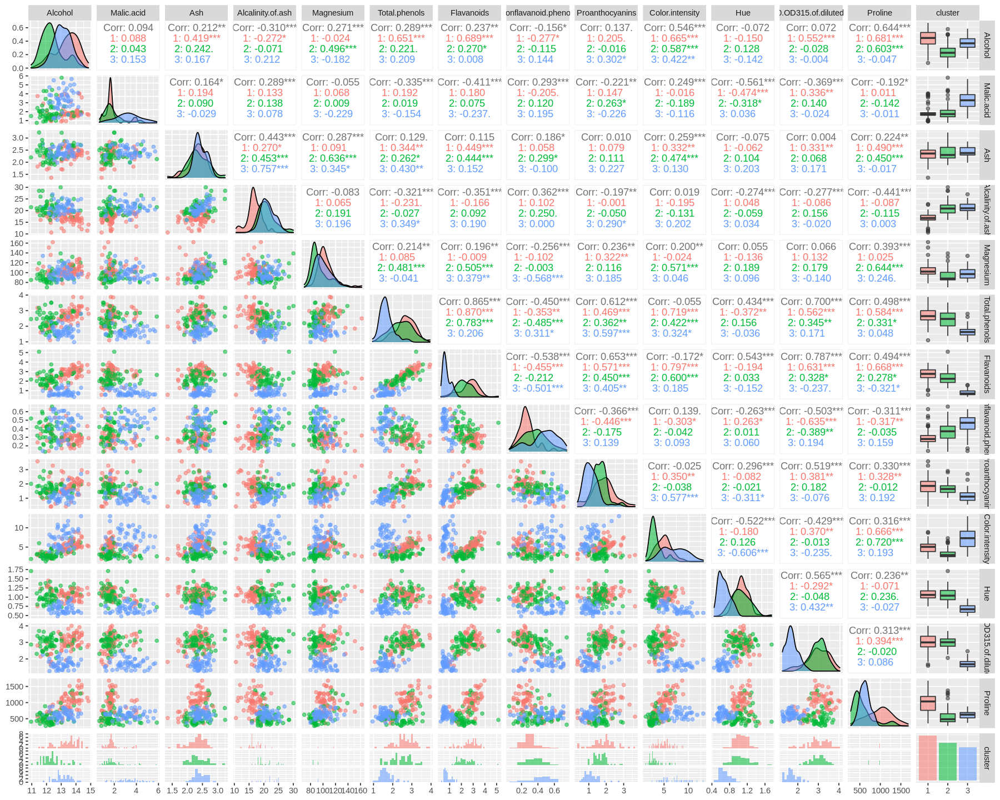

In [292]:
options(repr.plot.width=15, repr.plot.height=12)
suppressMessages( ggpairs(data.clust.hier,aes(color=cluster, alpha=0.5),lower = list(combo = wrap("facethist", binwidth = 0.1))))

# (09). Comparing Models

Contingency table (between kmeans and kmedoids)

In [193]:
xtabs(~data.clust.kmeans$cluster+data.clust.pam$cluster)

                         data.clust.pam$cluster
data.clust.kmeans$cluster  1  2  3
                        1  0  2 49
                        2 62  0  0
                        3 12 53  0

Contingency table (between kmeans and gaussian mixture model)

In [194]:
xtabs(~ data.clust.kmeans$cluster + data.clust.gmm$cluster)

                         data.clust.gmm$cluster
data.clust.kmeans$cluster  1  2  3
                        1  0  3 48
                        2 56  6  0
                        3  0 64  1

Contingency table (between kmeans and hierarchical clustering)

In [195]:
xtabs(~data.clust.kmeans$cluster+data.clust.hier$cluster)

                         data.clust.hier$cluster
data.clust.kmeans$cluster  1  2  3
                        1  1  0 50
                        2 52 10  0
                        3 16 48  1

Contingency table (between kmedoids and gaussian mixture model)

In [196]:
xtabs(~data.clust.pam$cluster+data.clust.gmm$cluster)

                      data.clust.gmm$cluster
data.clust.pam$cluster  1  2  3
                     1 56 17  1
                     2  0 55  0
                     3  0  1 48

Contingency table (between kmeans and hierarchical clustering)

In [197]:
xtabs(~data.clust.pam$cluster+data.clust.hier$cluster)

                      data.clust.hier$cluster
data.clust.pam$cluster  1  2  3
                     1 55 18  1
                     2 14 40  1
                     3  0  0 49

Contingency table (gaussian mixture model and hierarchical clustering)

In [198]:
xtabs(~data.clust.gmm$cluster+data.clust.hier$cluster)

                      data.clust.hier$cluster
data.clust.gmm$cluster  1  2  3
                     1 50  6  0
                     2 19 52  2
                     3  0  0 49

**Observation:-**  
In all of the above contingency table of clusters obtained by different method we can see the maximum number of cluster frequency either lies on the diagonal or in different rows and columns, means the cluster assignment in almost all the models is good.

# (10). Feature Reduction and Model Selection

Now I will check and select the model which fullfils most of the parameters provided by "clValid" package. Some are internal measures and some are stability measures.



Internal measures:-

In [295]:
#install.packages("clValid")

# library for model selection
suppressPackageStartupMessages( library(clValid))

# Computing clValid
clmethods <- c("hierarchical","kmeans","pam","model")  # different models
suppressWarnings( intern <- clValid(data.scaled, nClust = 2:8,
clMethods = clmethods, validation = "internal",method="complete"))

# Summary
suppressWarnings( summary(intern))


Clustering Methods:
 hierarchical kmeans pam model 

Cluster sizes:
 2 3 4 5 6 7 8 

Validation Measures:
                                  2        3        4        5        6        7        8
                                                                                         
hierarchical Connectivity   59.7575  63.4746  65.3052  67.0853  70.9433  77.5440  77.5440
             Dunn            0.1450   0.1592   0.1720   0.1856   0.1892   0.2031   0.2108
             Silhouette      0.1619   0.2038   0.1938   0.1884   0.1755   0.1886   0.1906
kmeans       Connectivity   37.6512  28.0504  54.5516  71.1119  74.9698  84.6262  85.0032
             Dunn            0.1357   0.2323   0.1644   0.1676   0.1676   0.2167   0.2766
             Silhouette      0.2593   0.2849   0.2651   0.2165   0.2027   0.2370   0.2238
pam          Connectivity   34.7790  45.0008  75.9865 101.8036 123.4290 129.1734 142.1393
             Dunn            0.1919   0.2035   0.1564   0.1599   0.1599   0.1743   

Observation:-   
k-means with k=3 seems to work good here.

Stability measures:-

In [305]:
# Stability measures
clmethods <- c("hierarchical","kmeans","pam","model")  # different models
suppressWarnings( stab <- clValid(data.scaled, nClust = 2:8, clMethods = clmethods,
validation = "stability",method="complete"))

# Display only optimal Scores
optimalScores(stab)%>%kable()



|    |     Score|Method |Clusters |
|:---|---------:|:------|:--------|
|APN | 0.0477141|kmeans |3        |
|AD  | 3.2727512|kmeans |8        |
|ADM | 0.2286323|kmeans |3        |
|FOM | 0.7258653|model  |8        |

Again k-means with k=3 seems to work good here too.

**Hence we could select the k-means clustering algorithm for this wine clustering data set.**

**Feature reduction for better interpretability of the model:-**

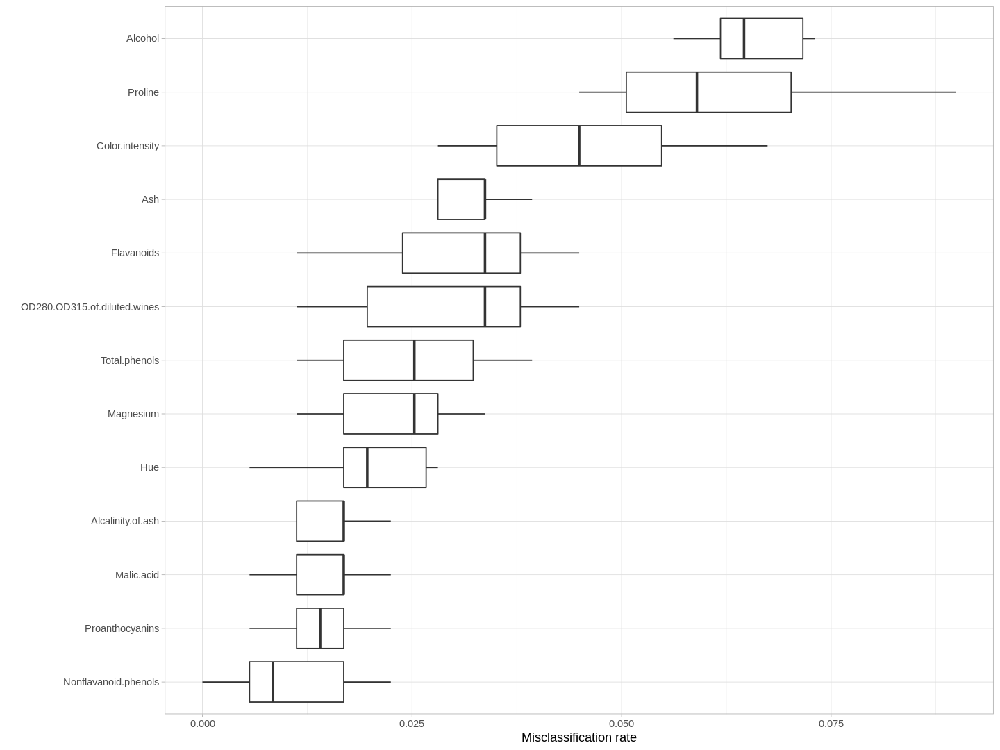

In [304]:
#devtools::install_github("o1iv3r/FeatureImpCluster")
#install.packages("flexclust")
library(FeatureImpCluster)
library(flexclust)

options(repr.plot.width=12, repr.plot.height=9)
set.seed(10)
res <- kcca(data.scaled,k=3)
#set.seed(10)
FeatureImp_res <- FeatureImpCluster(res,as.data.table(data.scaled))
plot(FeatureImp_res)


**Observation:-**  
We can observe highest missclassification rate is of "Alcohol" followed by "proline" and "Colour Intensity". Hence we can finnaly select these features as primary features for clustering. 
Now lets do kmeans clustering based on these three features and compare it with kmeans model for all the features to see if its working good in terrms of clustering or not.

**Kmeans clustering based on Reduced features-**

In [221]:
# making new data framed of reduced features

data.scaled <- as.data.frame(data.scaled)
data.reduced <- data[c("Alcohol","Proline","Color.intensity")]
str(data.reduced)
data.scaled.reduced <- data.scaled[c("Alcohol","Proline","Color.intensity")]
str(data.scaled.reduced)

'data.frame':	178 obs. of  3 variables:
 $ Alcohol        : num  14.2 13.2 13.2 14.4 13.2 ...
 $ Proline        : int  1065 1050 1185 1480 735 1450 1290 1295 1045 1045 ...
 $ Color.intensity: num  5.64 4.38 5.68 7.8 4.32 6.75 5.25 5.05 5.2 7.22 ...
'data.frame':	178 obs. of  3 variables:
 $ Alcohol        : num  1.514 0.246 0.196 1.687 0.295 ...
 $ Proline        : num  1.0102 0.9625 1.3912 2.328 -0.0378 ...
 $ Color.intensity: num  0.251 -0.292 0.268 1.183 -0.318 ...


In [214]:
# Compute k-means for reduced features with k = 3
set.seed(123)
km.res.reduced <- kmeans(data.scaled.reduced, 3, nstart = 25)
print(km.res.reduced)

K-means clustering with 3 clusters of sizes 32, 57, 89

Cluster means:
     Alcohol    Proline Color.intensity
1  0.3610772 -0.3468860       1.5425072
2  0.9464206  1.2258730       0.2273979
3 -0.7359601 -0.6603866      -0.7002462

Clustering vector:
  [1] 2 2 2 2 3 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 3 2 2 2 3 2 2 2 2 2 2 2 2 2 2 2
 [38] 2 2 2 2 2 2 3 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2
 [75] 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
[112] 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 1 3 3 1 3 3 2 3 3 1 3 1 1
[149] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 3 1 1 1 1 1 1 3 1 1 1 1 1 1 1

Within cluster sum of squares by cluster:
[1] 36.58516 57.73035 82.20253
 (between_SS / total_SS =  66.8 %)

Available components:

[1] "cluster"      "centers"      "totss"        "withinss"     "tot.withinss"
[6] "betweenss"    "size"         "iter"         "ifault"      


Visualising the clusters of reduced features:-

Warning message:
“ggrepel: 32 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


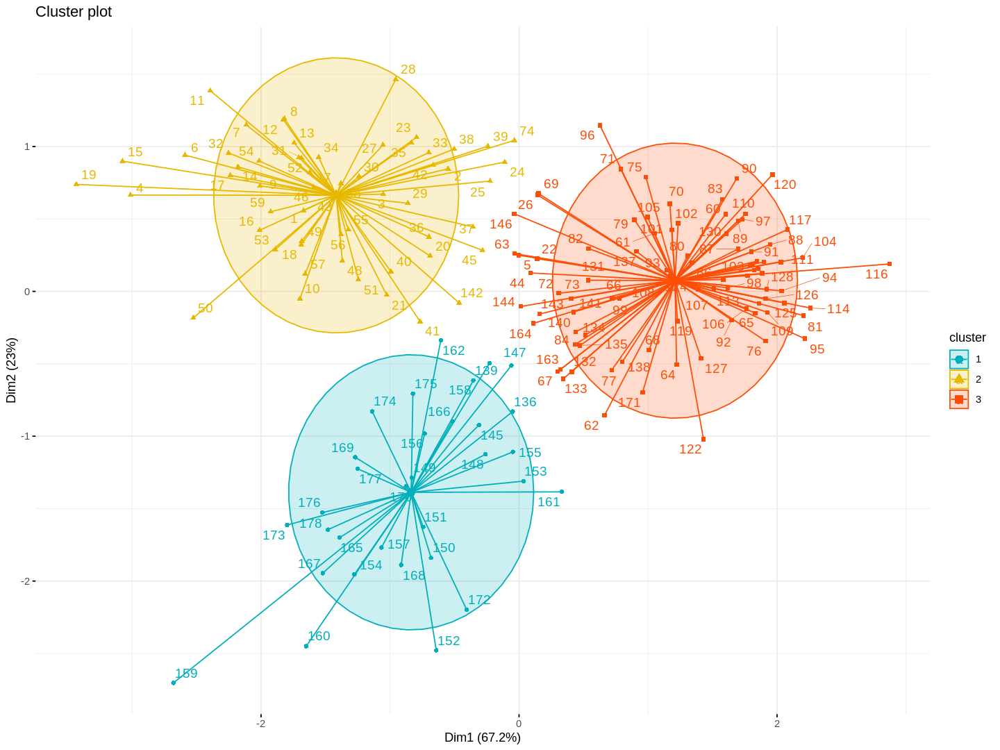

In [298]:
# visualising k-means result
options(repr.plot.width=12, repr.plot.height=9)
suppressWarnings( 
fviz_cluster(km.res.reduced, data = data.scaled.reduced,
palette = c( "#00AFBB", "#E7B800", "#FC4E07"),
ellipse.type = "euclid", # Concentration ellipse
star.plot = TRUE, # Add segments from centroids to items
repel = TRUE, # Avoid label overplotting (slow)
ggtheme = theme_minimal())
)

**Observation:-**  
It looks similar to the clusters obtained by clustering with all the features. Thats a great point indicating our reduced features are good. Lets explore it more.

**Clustered data set for reduced features:-**

In [303]:
# making cluster as factor
km.res.reduced$cluster <- as.factor(km.res.reduced$cluster)

# assining cluster to the original wine data set
data.clust.reduced.kmeans <- cbind(data.reduced, cluster = km.res.reduced$cluster)

# viewing the head ogf the clustered dataset
head(data.clust.reduced.kmeans)%>%kable()



| Alcohol| Proline| Color.intensity|cluster |
|-------:|-------:|---------------:|:-------|
|   14.23|    1065|            5.64|2       |
|   13.20|    1050|            4.38|2       |
|   13.16|    1185|            5.68|2       |
|   14.37|    1480|            7.80|2       |
|   13.24|     735|            4.32|3       |
|   14.20|    1450|            6.75|2       |

Aggregate (mean) table by cluster:-

In [300]:
aggar.reduced.kmeans <- aggregate(data.clust.reduced.kmeans[,1:3], by=list(data.clust.reduced.kmeans$cluster), mean) %>% as.data.frame()
aggar.reduced.kmeans %>% kable()



|Group.1 |  Alcohol|   Proline| Color.intensity|
|:-------|--------:|---------:|---------------:|
|1       | 13.29375|  637.6562|        8.634063|
|2       | 13.76895| 1132.9298|        5.585263|
|3       | 12.40315|  538.9326|        3.434719|

Visualising the clustered data (With reduced features):-

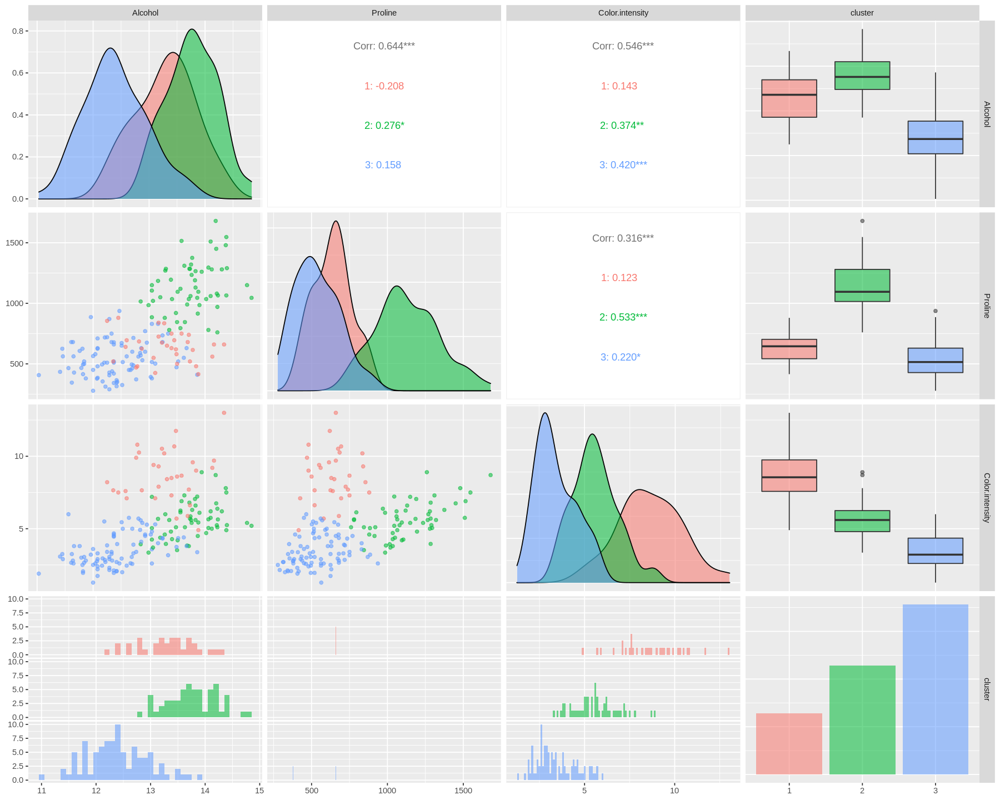

In [299]:
options(repr.plot.width=15, repr.plot.height=12)
suppressMessages( ggpairs(data.clust.reduced.kmeans,aes(color=cluster, alpha=0.5),lower = list(combo = wrap("facethist", binwidth = 0.1))))

**Observation:-**  
**Cluster 1:-** High Alcohol, Highest Colour intensity and Low Proline.  
**Cluster 2:-** Highest Alcohol, highest Proline and medium Colour Intensity.  
**Cluster 3:-** Everything is lowest.


Tabular form to identify and cluster the wines (may be now onwards by eyes and tastes):-

In [232]:
Cluster <- c("Cluster 1","Cluster 2","Cluster 3")
Alcohol <- c("High","Highest","Lowest")
Proline <- c("Low","Highest","Lowest")
Colour.intensity <- c("Highest","Medium","Lowest")
df<-data.frame(Cluster,Alcohol,Proline,Colour.intensity)
df %>% kable()



|Cluster   |Alcohol |Proline |Colour.intensity |
|:---------|:-------|:-------|:----------------|
|Cluster 1 |High    |Low     |Highest          |
|Cluster 2 |Highest |Highest |Medium           |
|Cluster 3 |Lowest  |Lowest  |Lowest           |

Comparing kmeans of reduced features with kmeans with all the features:-

In [302]:
xtabs(~data.clust.reduced.kmeans$cluster+data.clust.kmeans$cluster)

                                 data.clust.kmeans$cluster
data.clust.reduced.kmeans$cluster  1  2  3
                                1 32  0  0
                                2  1 56  0
                                3 18  6 65

The contingency table gives good result as the diagonal entries which implies matching clusters in both the results is far greater than missmatch. 

**FINAL MODEL SELECTION:-**  
So finally we select the kmeans model for this wine data set with "Alcohol","Proline" and "Colour Intensity" as our reduced features.

# (11). Conclusion

I explored rigiriously the different clustering algorithm (kmeans, kmedoids, hierarchical, gaussian mixture model) for clustering the wine data set.   
From begining, while doing multivariate analysis, there seemed to be three cluster in the data set and lastly we confirmed that by doing in-deapth analysis.  
At last I selected the k-means algorithm as the best clustering algorithm for this data set with reduced features namely "Alcohol", "Proline" and "Colour intensity".


So, there are three clusters in the given data set which we can identify by below table:-

In [269]:
df %>% kable()



|Cluster   |Alcohol |Proline |Colour.intensity |
|:---------|:-------|:-------|:----------------|
|Cluster 1 |High    |Low     |Highest          |
|Cluster 2 |Highest |Highest |Medium           |
|Cluster 3 |Lowest  |Lowest  |Lowest           |